

#Follow Your Pose:
# Pose-Guided Text-to-Video Generation using Pose-Free Videos


In [1]:
#@markdown Check type of GPU and VRAM available.
!nvidia-smi --query-gpu=name,memory.total,memory.free --format=csv,noheader

Tesla T4, 15360 MiB, 15101 MiB


In [2]:
#@title Installing python version 3.8
!sudo apt-get install python3.8
!sudo apt-get install python3.8-distutils

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  libpython3.8-minimal libpython3.8-stdlib mailcap mime-support
  python3.8-minimal
Suggested packages:
  python3.8-venv binfmt-support
The following NEW packages will be installed:
  libpython3.8-minimal libpython3.8-stdlib mailcap mime-support python3.8
  python3.8-minimal
0 upgraded, 6 newly installed, 0 to remove and 9 not upgraded.
Need to get 5,098 kB of archives.
After this operation, 18.9 MB of additional disk space will be used.
Get:1 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy/main amd64 libpython3.8-minimal amd64 3.8.18-1+jammy1 [794 kB]
Get:2 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy/main amd64 python3.8-minimal amd64 3.8.18-1+jammy1 [2,024 kB]
Get:3 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy/main amd64 libpython3.8-stdlib amd64 3.8.18-1+jammy1 [1,815 kB]
Get:4 https://ppa.

#Install Environment
This step sets up a personalized workspace for the task of this project.

In [3]:
!update-alternatives --install /usr/local/bin/python3 python3 /usr/bin/python3.8 2
!update-alternatives --install /usr/local/bin/python3 python3 /usr/bin/python3.9 1
!python --version
!apt-get update
!apt install software-properties-common
!sudo dpkg --remove --force-remove-reinstreq python3-pip python3-setuptools python3-wheel
!apt-get install python3-pip

print('Git clone project and install requirements...')
!git clone https://github.com/mayuelala/FollowYourPose.git

update-alternatives: using /usr/bin/python3.8 to provide /usr/local/bin/python3 (python3) in auto mode
update-alternatives: error: alternative path /usr/bin/python3.9 doesn't exist
Python 3.8.18
Get:1 http://security.ubuntu.com/ubuntu jammy-security InRelease [110 kB]
Get:2 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ InRelease [3,626 B]
Hit:3 http://archive.ubuntu.com/ubuntu jammy InRelease
Hit:4 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  InRelease
Get:5 http://archive.ubuntu.com/ubuntu jammy-updates InRelease [119 kB]
Hit:6 http://archive.ubuntu.com/ubuntu jammy-backports InRelease
Get:7 http://security.ubuntu.com/ubuntu jammy-security/multiverse amd64 Packages [44.0 kB]
Hit:8 https://ppa.launchpadcontent.net/c2d4u.team/c2d4u4.0+/ubuntu jammy InRelease
Get:9 http://archive.ubuntu.com/ubuntu jammy-updates/universe amd64 Packages [1,278 kB]
Hit:10 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy InRelease
Hit:11 https://ppa.lau

In [4]:
!cd /content/FollowYourPose
!export PYTHONPATH=/content/FollowYourPose:$PYTHONPATH
# %pip install -r requirements.txt
!python3.8 -m pip install -q -U --pre triton
!apt update
!python3.8 -m pip install -q diffusers==0.11.1 torch==1.13.1 transformers==4.26.0 bitsandbytes==0.35.4 \
imageio-ffmpeg xformers==0.0.16  --extra-index-url https://download.pytorch.org/whl/cu113



     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.2/89.2 MB 9.1 MB/s eta 0:00:00
Hit:1 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ InRelease
Hit:2 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  InRelease
Hit:3 http://security.ubuntu.com/ubuntu jammy-security InRelease
Hit:4 https://ppa.launchpadcontent.net/c2d4u.team/c2d4u4.0+/ubuntu jammy InRelease
Hit:5 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy InRelease
Hit:6 https://ppa.launchpadcontent.net/graphics-drivers/ppa/ubuntu jammy InRelease
Hit:7 https://ppa.launchpadcontent.net/ubuntugis/ppa/ubuntu jammy InRelease
Hit:8 http://archive.ubuntu.com/ubuntu jammy InRelease
Hit:9 http://archive.ubuntu.com/ubuntu jammy-updates InRelease
Hit:10 http://archive.ubuntu.com/ubuntu jammy-backports InRelease
Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
9 packages can be upgraded. Run 'apt list --upgradable' to see them.
     ━━━━━━━━━━━━━━

In [5]:
%cd /content/FollowYourPose/
!python3.8 -m pip install -r requirements.txt
!pip install MoviePy

/content/FollowYourPose
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 126.5/126.5 KB 2.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 199.7/199.7 KB 6.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 8.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 813.6/813.6 KB 11.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.0/117.0 KB 11.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 80.6/80.6 KB 8.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.0/60.0 KB 5.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 31.4/31.4 MB 32.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 195.4/195.4 KB 18.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 96.6/96.6 KB 12.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 300.0/300.0 KB 17.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

# Weight
This step clones the Followyourpose framework.

URL Ref: https://follow-your-pose.github.io/

In [1]:
%cd /content/FollowYourPose/
%rm -rf /content/FollowYourPose/checkpoints
%mkdir checkpoints
!git lfs install
!git clone https://huggingface.co/YueMafighting/FollowYourPose_v1
%mv /content/FollowYourPose/FollowYourPose_v1/* /content/FollowYourPose/checkpoints/
%rm -rf FollowYourPose_v1

/content/FollowYourPose
Updated git hooks.
Git LFS initialized.
Cloning into 'FollowYourPose_v1'...
remote: Enumerating objects: 42, done.
remote: Total 42 (delta 0), reused 0 (delta 0), pack-reused 42
Unpacking objects: 100% (42/42), 584.62 KiB | 8.23 MiB/s, done.
Filtering content: 100% (9/9), 9.75 GiB | 49.65 MiB/s, done.


# Setup
1. Storing videos into subfolders
2. Initializing variables


In [2]:
#@title Initialize variables
video_path = ""
video_full_path = ""
resized_video_full_path = ""
skeleton_path = ""
folder_full_path = ""

Choose Video from the data file so that we can load the video data

## Storing input videos into subfolders so that we can find the videos easily based on their types

* There are 4 files, Charades, youtube, sample, and Sims4Action
* The video for charades and sims4action are downloaded through google drive.

In [3]:
#[GAI - 5, Team18-6]
#[GAI - 40, Team18-76]
#@title Storing Video into subfolders
import os
import gdown

charades_dir = "/content/FollowYourPose/data/charades"
youtube_dir = "/content/FollowYourPose/data/youtube"
sample_dir = "/content/FollowYourPose/data/sample"
sims4action_dir = "/content/FollowYourPose/data/sims4action"

# Create the destination directory if it doesn't exist
os.makedirs(charades_dir, exist_ok=True)
os.makedirs(youtube_dir, exist_ok=True)
os.makedirs(sample_dir, exist_ok=True)
os.makedirs(sims4action_dir, exist_ok=True)

charades_urls = [  # Charades video download links
    "https://drive.google.com/uc?export=download&id=1qSGw4ABiClXqILD-u0MxR_YM8QT6Zsxs 0CFQV.mp4",
    "https://drive.google.com/uc?export=download&id=1Mls_wdXl2MvkRSEkpW04Lc321zT55XXL 0NVG2.mp4",
    "https://drive.google.com/uc?export=download&id=1U_khY997N6SX3maXBFH9VYB7cI7KCjnm 0NN7I.mp4",
    "https://drive.google.com/uc?export=download&id=1aqGru3-SG94RixVE9LwFru0p_Fow3Jyp 0M9ZO.mp4",
    "https://drive.google.com/uc?export=download&id=1tWC8k-BOE0mmjYyRj4Vxm9Dsjn5vITu4 0M6IY.mp4",
    "https://drive.google.com/uc?export=download&id=1K6yx5eZHqsoDIDsMXT1eswC-A3tmwmVM 0JXN3.mp4",
    "https://drive.google.com/uc?export=download&id=1F4s6b-IV_BWHfknNHcqMmLTUuZE-Z39Q 0IFCL.mp4",
    "https://drive.google.com/uc?export=download&id=1ACmgo-WDUSY0LFhI4kQsit3iqmnC4atp 0GH5O.mp4",
    "https://drive.google.com/uc?export=download&id=1UuNswRV8wc7nSbs2W9JmesymC2zXVgk6 0DJ6R.mp4",
    "https://drive.google.com/uc?export=download&id=19jn1Agvzdj7PbwTF8ZB6k-VUYw63nm57 0CX32.mp4"
]

youtube_urls = [
    # Add YouTube video download links here
]

sample_urls = [
    # Add sample video download links here
]

sims4action_urls = [
    "https://drive.google.com/uc?export=download&id=1ZFHCzH3kZd9fXbTIyPe-NKy31__yz4jl Co_S3K1_fC5.avi",
    "https://drive.google.com/uc?export=download&id=19wKuCFabB7YTmZV5LdlIB9YeikbwU1f6 Co_S1K1_fC6.avi"
]

# Function to check if a file already exists
def file_exists(file_path):
    return os.path.isfile(file_path)

# Download Charades files
for url_with_name in charades_urls:
    parts = url_with_name.split(" ")
    if len(parts) != 2:
        print(f"Invalid entry: {url_with_name}. It should be in the format 'URL Original_Name'.")
        continue

    url, original_name = parts
    file_name = os.path.join(charades_dir, original_name)
    if file_exists(file_name):
        print(f"Charades file {file_name} already exists, skipping download.")
    else:
        gdown.download(url, file_name, quiet=False)
        print(f"Downloaded Charades file: {original_name}")

# Download YouTube videos
for url_with_name in youtube_urls:
    parts = url_with_name.split(" ")
    if len(parts) != 2:
        print(f"Invalid entry: {url_with_name}. It should be in the format 'URL Original_Name'.")
        continue

    url, original_name = parts
    file_name = os.path.join(youtube_dir, original_name)
    if file_exists(file_name):
        print(f"YouTube file {file_name} already exists, skipping download.")
    else:
        gdown.download(url, file_name, quiet=False)
        print(f"Downloaded YouTube file: {original_name}")

# Download sample videos
for url_with_name in sample_urls:
    parts = url_with_name.split(" ")
    if len(parts) != 2:
        print(f"Invalid entry: {url_with_name}. It should be in the format 'URL Original_Name'.")
        continue

    url, original_name = parts
    file_name = os.path.join(sample_dir, original_name)
    if file_exists(file_name):
        print(f"Sample file {file_name} already exists, skipping download.")
    else:
        gdown.download(url, file_name, quiet=False)
        print(f"Downloaded Sample file: {original_name}")
# Download sims4action videos\n",
for url_with_name in sims4action_urls:
    parts = url_with_name.split(" ")
    if len(parts) != 2:
        print(f"Invalid entry: {url_with_name}. It should be in the format 'URL Original_Name'.")
        continue

    url, original_name = parts
    file_name = os.path.join(sims4action_dir, original_name)
    if file_exists(file_name):
        print(f"Sims4Action file {file_name} already exists, skipping download.")
    else:
        gdown.download(url, file_name, quiet=False)
        print(f"Downloaded Sims4Action file: {original_name}")

print("All files downloaded successfully.")

Downloading...
From: https://drive.google.com/uc?export=download&id=1qSGw4ABiClXqILD-u0MxR_YM8QT6Zsxs
To: /content/FollowYourPose/data/charades/0CFQV.mp4
100%|██████████| 1.88M/1.88M [00:00<00:00, 172MB/s]


Downloaded Charades file: 0CFQV.mp4


Downloading...
From: https://drive.google.com/uc?export=download&id=1Mls_wdXl2MvkRSEkpW04Lc321zT55XXL
To: /content/FollowYourPose/data/charades/0NVG2.mp4
100%|██████████| 1.08M/1.08M [00:00<00:00, 92.0MB/s]


Downloaded Charades file: 0NVG2.mp4


Downloading...
From: https://drive.google.com/uc?export=download&id=1U_khY997N6SX3maXBFH9VYB7cI7KCjnm
To: /content/FollowYourPose/data/charades/0NN7I.mp4
100%|██████████| 1.29M/1.29M [00:00<00:00, 91.8MB/s]


Downloaded Charades file: 0NN7I.mp4


Downloading...
From: https://drive.google.com/uc?export=download&id=1aqGru3-SG94RixVE9LwFru0p_Fow3Jyp
To: /content/FollowYourPose/data/charades/0M9ZO.mp4
100%|██████████| 2.16M/2.16M [00:00<00:00, 169MB/s]


Downloaded Charades file: 0M9ZO.mp4


Downloading...
From: https://drive.google.com/uc?export=download&id=1tWC8k-BOE0mmjYyRj4Vxm9Dsjn5vITu4
To: /content/FollowYourPose/data/charades/0M6IY.mp4
100%|██████████| 1.91M/1.91M [00:00<00:00, 117MB/s]


Downloaded Charades file: 0M6IY.mp4


Downloading...
From: https://drive.google.com/uc?export=download&id=1K6yx5eZHqsoDIDsMXT1eswC-A3tmwmVM
To: /content/FollowYourPose/data/charades/0JXN3.mp4
100%|██████████| 2.44M/2.44M [00:00<00:00, 144MB/s]


Downloaded Charades file: 0JXN3.mp4


Downloading...
From: https://drive.google.com/uc?export=download&id=1F4s6b-IV_BWHfknNHcqMmLTUuZE-Z39Q
To: /content/FollowYourPose/data/charades/0IFCL.mp4
100%|██████████| 2.54M/2.54M [00:00<00:00, 134MB/s]


Downloaded Charades file: 0IFCL.mp4


Downloading...
From: https://drive.google.com/uc?export=download&id=1ACmgo-WDUSY0LFhI4kQsit3iqmnC4atp
To: /content/FollowYourPose/data/charades/0GH5O.mp4
100%|██████████| 1.92M/1.92M [00:00<00:00, 156MB/s]


Downloaded Charades file: 0GH5O.mp4


Downloading...
From: https://drive.google.com/uc?export=download&id=1UuNswRV8wc7nSbs2W9JmesymC2zXVgk6
To: /content/FollowYourPose/data/charades/0DJ6R.mp4
100%|██████████| 890k/890k [00:00<00:00, 97.1MB/s]


Downloaded Charades file: 0DJ6R.mp4


Downloading...
From: https://drive.google.com/uc?export=download&id=19jn1Agvzdj7PbwTF8ZB6k-VUYw63nm57
To: /content/FollowYourPose/data/charades/0CX32.mp4
100%|██████████| 989k/989k [00:00<00:00, 122MB/s]


Downloaded Charades file: 0CX32.mp4


Downloading...
From: https://drive.google.com/uc?export=download&id=1ZFHCzH3kZd9fXbTIyPe-NKy31__yz4jl
To: /content/FollowYourPose/data/sims4action/Co_S3K1_fC5.avi
100%|██████████| 10.3M/10.3M [00:00<00:00, 36.7MB/s]


Downloaded Sims4Action file: Co_S3K1_fC5.avi


Downloading...
From: https://drive.google.com/uc?export=download&id=19wKuCFabB7YTmZV5LdlIB9YeikbwU1f6
To: /content/FollowYourPose/data/sims4action/Co_S1K1_fC6.avi
100%|██████████| 9.32M/9.32M [00:00<00:00, 24.3MB/s]

Downloaded Sims4Action file: Co_S1K1_fC6.avi
All files downloaded successfully.


# Choose video files from Charades project
1. Choose specific file to load from Charades folder
2. Watch playback of the video in 512x512 size

In [4]:
# [GAI - 6, Team18-7]
# @title Choose specific video file to load

import ipywidgets as widgets
from ipywidgets import Layout, Box, Dropdown, Label
import os

# Get the list of folders in the data directory
video_path = os.path.join(os.getcwd(), '/content/FollowYourPose/data')
folders_in_path = [folder for folder in os.listdir(video_path) if os.path.isdir(os.path.join(video_path, folder))]

# Initialize dropdowns for choosing folder
folder_dropdown = widgets.Dropdown(options=folders_in_path, description='📂:', layout=Layout(width='50%'))
video_dropdown = widgets.Dropdown(description='▶️:', layout=Layout(width='50%')) # initially empty

#Layout
form_item_layout = Layout(
    display='flex',
    flex_flow='row',
    justify_content='space-between',
)

def update_video_dropdown(selected_folder):
    # Get the list of files in the selected folder
    files = [i for i in os.listdir(os.path.join(video_path, selected_folder)) if os.path.isfile(os.path.join(video_path, selected_folder, i)) and "_resized" not in i]
    video_dropdown.options = files
    # Handling of dropdown if no videos in selected folder
    video_dropdown.disabled = len(files) == 0
    video_dropdown.options = [f'No videos available in {selected_folder} folder'] if len(files) == 0 else files

def folder_dropdown_handler(change):
    selected_folder = change.new
    update_video_dropdown(selected_folder)
folder_dropdown.observe(folder_dropdown_handler, names='value')


initial_selected_folder = folder_dropdown.value
update_video_dropdown(initial_selected_folder)

# Form items - folder dropdown and video dropdown
form_items = [
    Box([Label(value='Choose a folder from the data directory'), folder_dropdown], layout=form_item_layout),
    Box([Label(value='Choose a video from the selected folder'), video_dropdown], layout=form_item_layout)
]

form = Box(form_items, layout=Layout(
    display='flex',
    flex_flow='column',
    border='solid 1px',
    align_items='stretch',
    width='50%',
    padding = '1%'
))

#display the elements
display(form)


def video_dropdown_handler(change):
    global chosen_video_dropdown_input
    global video_full_path
    global folder_full_path
    chosen_video_dropdown_input = change.new
    print('\r', 'Chosen video:', chosen_video_dropdown_input, end='')
    if video_dropdown.value != "":
      video_full_path = os.path.join(video_path, folder_dropdown.value, video_dropdown.value)
    folder_full_path = os.path.join(video_path, folder_dropdown.value)
video_dropdown.observe(video_dropdown_handler, names='value')

Box(children=(Box(children=(Label(value='Choose a folder from the data directory'), Dropdown(description='📂:',…

## Show selected video from dropdown
The selected video will be shown in 512x512 size

In [ ]:
#[GAI - 7] -- Watch video playback
#[GAI - 35] -- Crop videos to 512x512
#@title Watch video playback, crop video to 512x512

from moviepy.editor import VideoFileClip
import os

if video_full_path == "":
  video_full_path = os.path.join(video_path, folder_dropdown.value, video_dropdown.value)

clip = VideoFileClip(video_full_path)

orig_width, orig_height = clip.size
if orig_width > orig_height:
  margin_size = round((orig_width - orig_height) / 2)
  square_clip = clip.margin(top=margin_size, bottom=margin_size)
elif orig_width < orig_height:
  margin_size = round((orig_height - orig_width) / 2)
  square_clip = clip.margin(left=margin_size, right=margin_size)
else:
  square_clip = clip

resized_clip = square_clip.resize(width=512)

#saving the resized clip in a permanent location
resized_clip.write_videofile(video_full_path.split(".")[0] + "_resized.mp4")
resized_video_full_path = video_full_path.split(".")[0] + "_resized.mp4"

resized_clip.ipython_display()

# Inference

Loading Pre-trained model and adjusting clip timings so that I can customize the clip's duration

Recommended value = 8

### Step 1: Installing Required Libraries

In this step, you set up the environment by installing the necessary libraries for the project, which include:


1.   **mmcv**: Multimedia Computer Vision is a library that provides essential functionalities for computer vision tasks.
2.   **mmdet**: This is likely the MMDetection library, which is used for object detection tasks in computer vision.
3.   **mmpose**: MMPose is a pose estimation library.

You also clone the mmpose repository and install its requirements. Additionally, you install opencv-python-headless for computer vision tasks and upgrade bitsandbytes to ensure compatibility.

In [5]:
#@title Step 1: Install Needed Libraries for mmpose (Part 1)
#[GAI - 11a & 11b, TEAM18-14 & TEAM18-63]

!sudo apt-get install python3.8
!sudo apt-get install python3.8-distutils
# Set Python 3.8 as the default
!sudo update-alternatives --install /usr/bin/python3 python3 /usr/bin/python3.8 1
# Check Python version
!python3 --version
# Update system packages
!sudo apt update
!apt-get install python3-pip
# Check pip version for Python 3.8
!python3.8 -m pip --version

# Install PyTorch and related libraries for CUDA version 11.1 (cu117)
!pip install torch==2.0.0+cu117 torchvision==0.15.1+cu117 --index-url https://download.pytorch.org/whl/cu117




Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
python3.8 is already the newest version (3.8.18-1+jammy1).
0 upgraded, 0 newly installed, 0 to remove and 9 not upgraded.
Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
python3.8-distutils is already the newest version (3.8.18-1+jammy1).
0 upgraded, 0 newly installed, 0 to remove and 9 not upgraded.
update-alternatives: renaming python3 link from /usr/local/bin/python3 to /usr/bin/python3
Python 3.8.18
Hit:1 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ InRelease
Hit:2 http://security.ubuntu.com/ubuntu jammy-security InRelease
Hit:3 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  InRelease
Hit:4 http://archive.ubuntu.com/ubuntu jammy InRelease
Hit:5 http://archive.ubuntu.com/ubuntu jammy-updates InRelease
Hit:6 http://archive.ubuntu.com/ubuntu jammy-backports InRelease
Hit:7 https://ppa.launchpadconte

In [6]:
#@title Step 1.2: Install Needed Libraries for mmpose (Part 2)
#[GAI - 11a & 11b, TEAM18-14 & TEAM18-63]

# Install OpenMMLab's OpenMIM
!pip install -U openmim

# Install the MMEngine package using OpenMIM
!mim install mmengine

# Install mmcv package (a dependency) with a minimum version of 2.0.0
!mim install "mmcv>=2.0.0"

# Install mmdet package (a dependency) with a minimum version of 3.1.0 using OpenMIM
!mim install "mmdet>=3.1.0"

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.7/52.7 kB 960.2 kB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 240.6/240.6 kB 10.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 33.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 297.3/297.3 kB 33.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 55.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.1/77.1 kB 7.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 259.5/259.5 kB 24.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 502.5/502.5 kB 39.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 953.1/953.1 kB 50.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 239.4/239.4 kB 24.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.7/89.7 kB 9.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━

Looking in links: https://download.openmmlab.com/mmcv/dist/cu117/torch2.0.0/index.html
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 450.1/450.1 kB 8.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 254.7/254.7 kB 31.5 MB/s eta 0:00:00
  Using cached importlib_metadata-6.8.0-py3-none-any.whl (22 kB)
  Attempting uninstall: importlib-metadata
    Found existing installation: importlib-metadata 6.0.0
    Uninstalling importlib-metadata-6.0.0:
      Successfully uninstalled importlib-metadata-6.0.0
Looking in links: https://download.openmmlab.com/mmcv/dist/cu117/torch2.0.0/index.html
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.5/98.5 MB 6.5 MB/s eta 0:00:00
Looking in links: https://download.openmmlab.com/mmcv/dist/cu117/torch2.0.0/index.html
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 23.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 439.5/439.5 kB 46.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 34.5/34.5 MB 43.6 MB/

In [7]:
#@title Step 1.3: Install Needed Libraries for mmpose (Part 3)
#[GAI - 11a & 11b, TEAM18-14 & TEAM18-63]

#Change directory to keep mmpose
%cd /content/FollowYourPose

# Clone the mmpose repository from GitHub
!git clone https://github.com/open-mmlab/mmpose.git

# Change the working directory to the cloned mmpose repository
%cd mmpose

# Install the requirements specified in the repository's requirements.txt
!pip install -r requirements.txt

# Install mmpose as an editable package in your environment
!pip install -v -e .

# Install mmpose package (a dependency) with a minimum version of 1.1.0
!mim install "mmpose>=1.1.0"

/content/FollowYourPose
Cloning into 'mmpose'...
remote: Enumerating objects: 30322, done.
remote: Counting objects: 100% (1098/1098), done.
remote: Compressing objects: 100% (562/562), done.
remote: Total 30322 (delta 571), reused 947 (delta 525), pack-reused 29224
Receiving objects: 100% (30322/30322), 52.76 MiB | 27.74 MiB/s, done.
Resolving deltas: 100% (21370/21370), done.
/content/FollowYourPose/mmpose
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.6/50.6 kB 1.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 447.7/447.7 kB 13.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 228.6/228.6 kB 5.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.3/58.3 kB 7.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.3/45.3 kB 5.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.3/42.3 kB 4.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 325.1/325.1 kB 2

In [8]:
#@title Step 1.4: Install Needed Libraries for mmpose (Part 4)
#[GAI - 11a & 11b, TEAM18-14 & TEAM18-63]

# Install opencv-python-headless package
!pip install opencv-python-headless

# Install bitsandbytes
!pip install --upgrade bitsandbytes

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.1/49.1 MB 13.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 92.6/92.6 MB 6.8 MB/s eta 0:00:00
  Attempting uninstall: bitsandbytes
    Found existing installation: bitsandbytes 0.35.4
    Uninstalling bitsandbytes-0.35.4:
      Successfully uninstalled bitsandbytes-0.35.4


###Step 2: Choose video files

You select a video input from the video folders. This video will serve as the source for pose estimation and character generation.
We used **Ipywidgets** Library to show our widget here to easily pick the video input from a drop down box

In [9]:
#[GAI - 9] - Choose video files from Charades Folder
!pip install ipywidgets

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.4/139.4 kB 2.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 43.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.0/85.0 kB 5.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 798.3/798.3 kB 43.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 214.9/214.9 kB 25.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 69.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.0/59.0 kB 8.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 385.5/385.5 kB 36.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 100.8/100.8 kB 11.3 MB/s eta 0:00:00


In [ ]:
#[GAI - 9, TEAM18-10] - Choose video files
#@title Step 2:  Choose video files

import ipywidgets as widgets
from ipywidgets import Layout, Box, Dropdown, Label
import os

data_path = '/content/FollowYourPose/data'
folders = [folder for folder in os.listdir(data_path) if os.path.isdir(os.path.join(data_path, folder))]

# Initialize dropdowns for folder and video selection
videofolder_dropdown = widgets.Dropdown(description='Folder:', options=folders, layout=Layout(width='50%'))
video_dropdown = widgets.Dropdown(description='Video:', layout=Layout(width='50%'))

def update_video_dropdown(change):
    folder = change.new
    video_path = os.path.join(data_path, folder)
    videos = [video for video in os.listdir(video_path) if os.path.isfile(os.path.join(video_path, video))]
    video_dropdown.options = videos

def dropdown_handler(change):
    global video_full_path
    global folder_full_path
    print('\r','Chosen video: ' + str(change.new),end='')
    video = change.new
    video_full_path = os.path.join(data_path, videofolder_dropdown.value, video)
    folder_full_path = os.path.join(data_path, videofolder_dropdown.value)

videofolder_dropdown.observe(update_video_dropdown, names='value')
video_dropdown.observe(dropdown_handler, names='value')

# Layouts
form_item_layout = Layout(
    display='flex',
    flex_flow='row',
    justify_content='space-between',
)

# Form items - label and dropdowns
form_items = [
    Box([Label(value='Choose a folder from /content/FollowYourPose/data'),
         videofolder_dropdown], layout=form_item_layout),
    Box([Label(value='Choose a video from the selected folder'),
         video_dropdown], layout=form_item_layout)
]

form = Box(form_items, layout=Layout(
    display='flex',
    flex_flow='column',
    border='solid 1px',
    align_items='stretch',
    width='50%',
    padding='1%'
))

# Display the elements
display(form)


Box(children=(Box(children=(Label(value='Choose a video from the Charades project folder'), Dropdown(descripti…

###Step 3: Selecting Pre-trained Model & Video Length
In this step, you choose a pre-trained model. It will be used to run FollowYourPose at the last step.

You might also make modifications to the configuration file, such as changing the video length. This can help in adjusting the model's behavior to your specific needs. It is recommanded to set the video length to 8 or lesser.

In [ ]:
#[GAI-4, TEAM18-9]
#[GAI-8, TEAM18-9]
#[GAI-22, TEAM18-9]
#@title Step 3:  Select Model that is going to be used for inference and set the video length to 8 or lesser

import ipywidgets as widgets
from ipywidgets import HBox, Label
from ipywidgets import Layout, Button, Box, FloatText, Textarea, Dropdown, Label, IntSlider
import time
import pandas as pd
import os
from IPython.display import display

path = os.path.join(os.getcwd(), '/content/FollowYourPose/checkpoints/')

folder_names = [name for name in os.listdir(path) if os.path.isdir(os.path.join(path, name)) and name != "followyourpose_checkpoint-1000"]

# Layout
form_item_layout = Layout(
    display='flex',
    flex_flow='row',
    justify_content='space-between',
)
folder_names.insert(0, "")

# IntText widget
video_length_widget = widgets.IntText(
    value=0,
    layout=Layout(width='50%')  # Adjust the width as needed
)

# Dropdown widget
folder_dropdown = widgets.Dropdown(
    options=folder_names,
    layout=Layout(width='50%')  # Adjust the width as needed
)


# Event handler for dropdown
def inttext_handler(change):
    global video_length
    print('\r','Chosen video length: ' + str(change.new), end='')
    video_length = change.new

video_length_widget.observe(inttext_handler, names='value')

# Event handler for dropdown
def dropdown_handler(change):
    global drop_down_input
    print('\r','Chosen pre-trained model: ' + str(change.new), end='')
    drop_down_input = change.new

folder_dropdown.observe(dropdown_handler, names='value')

# Button
button = widgets.Button(description="Generate")

# Event handler for button click
def on_button_click(b):
    video_length = video_length_widget.value
    if drop_down_input == "Dropdown_input_1":
        print("\n Please choose a file")
    else:
        file_path = open("/content/FollowYourPose/configs/pose_sample.yaml", "r")
        with open("/content/FollowYourPose/configs/pose_sample.yaml", "r") as file:
            lines = file.readlines()
        if lines:
            # Modify the first line (assuming you want to replace it)
            new_first_line = 'pretrained_model_path: "./checkpoints/' + drop_down_input + '"\n'
            new_tenth_line = '  video_length: ' + str(video_length) + '\n'
            lines[0] = new_first_line
            lines[9] = new_tenth_line
            # Open the file in write mode to save the modified content
            with open("/content/FollowYourPose/configs/pose_sample.yaml", "w") as file:
                file.writelines(lines)
            print("\nLine has been changed")

# Link the function to the button
button.on_click(on_button_click)

# Form items
form_items = [
    Box([Label(value='Choose a Pre-trained Model'), folder_dropdown], layout=form_item_layout),
    Box([Label(value='Enter Video Length(in seconds)'), video_length_widget], layout=form_item_layout)  # Added IntText widget
]

# Create the form
form = Box(form_items, layout=Layout(
    display='flex',
    flex_flow='column',
    border='solid 1px',
    align_items='stretch',
    width='100%',
    padding='1%'
))

# Display the form and button
display(form)
display(button)


Box(children=(Box(children=(Label(value='Choose a Pre-trained Model'), Dropdown(layout=Layout(width='50%'), op…

Button(description='Generate', style=ButtonStyle())

 Chosen video length: 8
Line has been changed


###Step 4: Edit Prompts
The prompts you edit are the textual descriptions or instructions that you provide to the "FollowYourPose" component. Based on these prompts, the AI will generate characters that mimic the poses described in the text, possibly using the estimated poses from the video.


In [ ]:
# Step 4: Edit prompts
# @markdown Click the dropdown to select the config file the model will be using.
# @markdown To edit prompts, simply change the text.
# @markdown The program will save your changes automatically.

# Team18-12

import os
import ipywidgets as widgets
from IPython.display import clear_output
import yaml

selected_config_file_name = 'pose_sample.yaml' # default file/ needed for 1st run

# To fix the yaml saving indents improperly hehe
class IndentDumper(yaml.Dumper):
    def increase_indent(self, flow=False, indentless=False):
        return super(IndentDumper, self).increase_indent(flow, False)

# Assigning prompts from yaml
config_path = os.path.join(os.getcwd(), '/content/FollowYourPose/configs')

# Function to load prompts from selected YAML file
def load_prompts_from_file(file_name):
    with open(os.path.join(config_path, file_name)) as f:
        config = yaml.safe_load(f)
    return config['validation_data']['prompts']

# Dropdown widget to select YAML file
yaml_files = [file for file in os.listdir(config_path) if file.endswith('.yaml')]
yaml_dropdown = widgets.Dropdown(options=yaml_files, value=selected_config_file_name,description='Config File📮')

# Event handler for dropdown change
def handle_yaml_change(change):
    global prompts, selected_config_file_name
    selected_config_file_name = change.new
    prompts = load_prompts_from_file(change.new)
    reset_cell_display()

yaml_dropdown.observe(handle_yaml_change, names='value')
tags_container = widgets.VBox() # Container for all widgets

# Creating widgets for each prompt
def initialize_widgets(prompts):
    global text_widgets, delete_buttons
    text_widgets = [widgets.Text(value=prompt, description='Prompt {}'.format(i + 1)) for i, prompt in enumerate(prompts)]
    delete_buttons = [widgets.Button(description='Delete', layout=widgets.Layout(width='70px')) for _ in text_widgets]
    for i, delete_button in enumerate(delete_buttons):
        delete_button.on_click(lambda event, index=i: handle_delete(event, index))
    for index, text_widget in enumerate(text_widgets):
        text_widget.observe(lambda change, index=index: handle_text_change(change, index), names='value')

new_prompt_widget = widgets.Text(description='New Prompt:', placeholder='Enter a new prompt...')
add_prompt_button = widgets.Button(description='Add Prompt') # Add prompt btn

def add_prompt(sender):
    new_prompt = new_prompt_widget.value.strip()
    if new_prompt:
        new_text_widget = widgets.Text(value=new_prompt, description='Prompt {}'.format(len(text_widgets) + 1))
        text_widgets.append(new_text_widget)
        delete_button = widgets.Button(description='Delete', layout=widgets.Layout(width='70px'))
        delete_buttons.append(delete_button)
        new_text_widget.observe(lambda change, index=len(text_widgets)-1: handle_text_change(change, index), names='value')
        delete_button.on_click(lambda event, index=len(text_widgets)-1: handle_delete(event, index))

        # Add the new prompt to .yaml config
        with open(os.path.join(config_path, selected_config_file_name)) as f:
            config = yaml.safe_load(f)
        config['validation_data']['prompts'].append(new_prompt)
        with open(os.path.join(config_path, selected_config_file_name), 'w') as f:
            yaml.dump(config, f, sort_keys=False, Dumper=IndentDumper)

    new_prompt_widget.value = ''
    update_tags_container()

add_prompt_button.on_click(add_prompt) # onCLick event

# Update display of prompts
def update_tags_container():
    tags_container.children = [yaml_dropdown] + [widgets.HBox([text_widget, delete_button]) for text_widget, delete_button in zip(text_widgets, delete_buttons)] + [new_prompt_widget, add_prompt_button]


def handle_text_change(change, index):
    # If textfield change, write to file
    if change['type'] == 'change':
        with open(os.path.join(config_path, selected_config_file_name)) as f:
            config = yaml.safe_load(f)
        config['validation_data']['prompts'][index] = change['new'].strip()
        with open(os.path.join(config_path, selected_config_file_name), 'w') as f:
            yaml.dump(config, f, sort_keys=False, Dumper=IndentDumper)

    # If textfield empty, delete
    if not change['new'].strip():
        handle_delete(None, index)

def handle_delete(event, index):
    with open(os.path.join(config_path, selected_config_file_name)) as f:
        config = yaml.safe_load(f)
    del config['validation_data']['prompts'][index]
    with open(os.path.join(config_path, selected_config_file_name), 'w') as f:
        yaml.dump(config, f, sort_keys=False, Dumper=IndentDumper)
    reset_cell_display()            # Refresh cell display

def reset_cell_display():
    prompts = load_prompts_from_file(selected_config_file_name)
    clear_output()              # Clear cell display of
    initialize_widgets(prompts) # Re-initialize widgets
    update_tags_container()     # Update tags container
    display(tags_container)     # Display the tags container

reset_cell_display()            # Refresh cell display

### Step 5: Creation of Skeleton Video

In this Step, you're setting up the inference process for generating skeleton visualization videos from an original video using mmpose. The code begins by selecting a video input from Charades video folders. It then provides two visualization options: one with a black background and one with a superimposed skeleton on the original video. Upon selecting a format, the inference function is triggered, which runs the pose estimation using the chosen model and video, saving the resulting video in a designated directory.

The code also allows you to select the original video and its corresponding skeleton visualization for comparison. It loads the selected videos, resizes them, and displays them side by side for visual comparison, facilitating the evaluation of the skeleton visualization against the original video.

This streamlines the process of running inference and visualizing the results for evaluation.

In [ ]:
#GAI 11A [TEAM18-14] - inference
# @title Skeleton Video using mmpose
from IPython.display import HTML, display, Video, clear_output
from ipywidgets import widgets, Output, interactive
import ipywidgets as widgets
from ipywidgets import HBox
import os
import time
import subprocess
import yaml

# Choosen pre-trained model
file_path = '/content/FollowYourPose/configs/pose_sample.yaml'
with open(file_path, 'r') as file:
    config = yaml.safe_load(file)
current_pretrained_model_path = config.get('pretrained_model_path', '')

# Choose Video
clip_path = os.path.join('/content/FollowYourPose/data/',videofolder_dropdown.value, video_dropdown.value)
video_filename = os.path.splitext(os.path.basename(clip_path))[0]  # Remove ".mp4" extension
filepath_name = os.path.splitext(os.path.basename(current_pretrained_model_path))[0]  # Remove ".mp4" extension

print('Current pretrained_model path:', filepath_name)
print('Current video:', video_filename)
print("This will take about 1-5mins...")
print("\n")

# Inference function
vis_out_dir = "/content/FollowYourPose/mmpose/skeleton_output/Visualization/"  # Visualization output directory
os.makedirs(vis_out_dir, exist_ok=True)

# Change path to inference_demo.py
%cd /content/FollowYourPose/mmpose/demo

!python inferencer_demo.py \
    "{clip_path}" \
    --pose2d human --vis-out-dir "{vis_out_dir}"  --black-background

# Define the expected output video path
expected_output_video_path = f'/content/FollowYourPose/mmpose/skeleton_output/Visualization/{video_filename}.mp4'  # Replace with the actual path

if os.path.exists(expected_output_video_path):
    clear_output(wait=True)
    print(f"Video saved to Path: {vis_out_dir}.")
else:
    print("\nError, try re-installing needed libraries again (Step 1.2 & Step 1.3)")


Video saved to Path: skeleton_output/Visualization.


In [ ]:
#GAI 11A [TEAM18-14] - inference
# @title Video Player Selector
from moviepy.editor import VideoFileClip, clips_array

# Define the source video folder and visualization folder paths
source_folder = folder_full_path
visualization_folder = '/content/FollowYourPose/mmpose/skeleton_output/Visualization'

# Initialize the paths as global variables
original_path = ""
skeleton_path = ""

# Function to get a list of video files in a folder
def get_video_files(folder):
    if os.path.exists(folder) and os.path.isdir(folder):
        video_files = [f for f in os.listdir(folder) if f.endswith('.mp4')]
        return video_files
    else:
        return []

# Create a dropdown for selecting the source video
source_video_dropdown = widgets.Dropdown(
    options=get_video_files(source_folder),
    description='Select Original Video:'
)

# Create a dropdown for selecting the visualization video
visualization_video_dropdown = widgets.Dropdown(
    options=get_video_files(visualization_folder),
    description='Select Skeleton Video:'
)

def Save_Option(change):
  global original_path  # Use the global keyword to modify the global variable
  global skeleton_path
  original_path = os.path.join(source_folder,source_video_dropdown.value)
  skeleton_path = os.path.join(visualization_folder,visualization_video_dropdown.value)
  print("Saved Option")

# Create a button to play the videos
play_button = widgets.Button(description="Save Option")
play_button.on_click(Save_Option)

# Display the widgets
print("Pick the original video that was selected before generating the skeleton video and pick the same video name for the skeleton video.")
display(source_video_dropdown)
display(visualization_video_dropdown)
display(play_button)

Pick the original video that was selected before generating the skeleton video and pick the same video name for the skeleton video.


Dropdown(description='Select Original Video:', options=('0CFQV.mp4', '0GH5O.mp4', '0NN7I.mp4', '0CFQV_resized.…

Dropdown(description='Select Skeleton Video:', options=('0CFQV_resized.mp4',), value='0CFQV_resized.mp4')

Button(description='Save Option', style=ButtonStyle())

Saved Option


In [ ]:
#GAI 11A [TEAM18-14] - inference
# @title Video Player for inference Original vs Skeleton comparison
from moviepy.editor import VideoFileClip, clips_array

print(f"\nOriginal Video Path is {original_path}")
print(f"Skeleton Video Path is {skeleton_path}")

# Load the two video clips
video1 = VideoFileClip(original_path)
video2 = VideoFileClip(skeleton_path)

# Resize the video clips
video1 = video1.resize(width=300)
video2 = video2.resize(width=300)

# Create an overlay by placing video2 on the right of video1
final_video = clips_array([[video1, video2]])

# Display the overlay video
final_video.ipython_display()



Original Video Path is /content/FollowYourPose/data/charades/0CFQV.mp4
Skeleton Video Path is /content/FollowYourPose/mmpose/skeleton_output/Visualization/0CFQV_resized.mp4
Moviepy - Building video __temp__.mp4.
MoviePy - Writing audio in __temp__TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video __temp__.mp4



t:  99%|█████████▉| 519/525 [00:11<00:00, 40.97it/s, now=None]WARNING:py.warnings:/usr/local/lib/python3.10/dist-packages/moviepy/video/io/ffmpeg_reader.py:123: UserWarning: Warning: in file /content/FollowYourPose/data/charades/0CFQV.mp4, 518400 bytes wanted but 0 bytes read,at frame 522/525, at time 20.88/20.97 sec. Using the last valid frame instead.
  warnings.warn("Warning: in file %s, "%(self.filename)+

t: 100%|█████████▉| 524/525 [00:11<00:00, 40.74it/s, now=None]WARNING:py.warnings:/usr/local/lib/python3.10/dist-packages/moviepy/video/io/ffmpeg_reader.py:123: UserWarning: Warning: in file /content/FollowYourPose/data/charades/0CFQV.mp4, 518400 bytes wanted but 0 bytes read,at frame 523/525, at time 20.92/20.97 sec. Using the last valid frame instead.
  warnings.warn("Warning: in file %s, "%(self.filename)+

  warnings.warn("Warning: in file %s, "%(self.filename)+



Moviepy - Done !
Moviepy - video ready __temp__.mp4


### Step 6: Skeleton to Inference Video

 This section automates the process of running FollowYourPose, saving generated videos to a specified directory, and providing a convenient way to view and evaluate the results, including both the generated videos and their skeleton superimposed versions.


1.   **Library Installation and Configuration**: Libraries like accelerate and xformers are upgraded to support deep learning and transformers.
2.   **Output Directory Selection**: Users specify the directory for saving generated videos via the OUTPUT_DIR variable.The txt2video.py script is then edited to change video output paths to match the user-defined OUTPUT_DIR.
3. **Run FollowYourPose:** FollowYourPose is executed, converting text prompts into videos based on the chosen model and skeleton input. Output and response time are displayed in real-time.
4. **Play the Video output with caption:** The code searches for and displays generated GIFs with captions.
5.**Running MMPose on GIF to generate superimpose skeleton on resultant GIF:** GIFs are transformed into MP4 videos, using the inferencer_demo.py script from mmpose to superimpose skeletons onto one of the converted videos.   
6. **Displaying  SuperImposed Skeleton on Resultant Video:** GIF with superimposed skeletons are  displayed for evaluation, along with captions.



In [ ]:
# [GAI - 26, Team18-19]
# @title Choose Location where videos are outputted to


#@markdown Please provide the name of the directory where the video should be saved.
OUTPUT_DIR = "/content/FollowYourPose/Inference" #@param {type:"string" }

# Changing save_path in txt2video.py
path = os.path.join(os.getcwd(), '/content/FollowYourPose/txt2video.py')

a_file = open(path, "r")
list_of_lines = a_file.readlines()
start_index_171 = list_of_lines[171 -1].find('"') + 1
end_index_171 = list_of_lines[171 -1].rfind('"')

start_index_174 = list_of_lines[174 -1].find('"') + 1
end_index_174 = list_of_lines[174 -1].rfind('"')

# Line 171 OG: 6tabs save_videos_grid(sample, f"{output_dir}/inference/sample-{global_step}-{str(seed)}-{now}/{prompt}.gif")
list_of_lines[171 -1] = list_of_lines[171 -1][:start_index_171] + f"{OUTPUT_DIR}/sample-{{global_step}}-{{str(seed)}}-{{now}}/{{prompt}}.gif" + list_of_lines[171 -1][end_index_171:]

# Line 174 OG: 4tabs save_path = f"{output_dir}/inference/sample-{global_step}-{str(seed)}-{now}.gif"
list_of_lines[174 -1] = list_of_lines[174 -1][:start_index_174] + f"{OUTPUT_DIR}/sample-{{global_step}}-{{str(seed)}}-{{now}}.gif" + list_of_lines[174 -1][end_index_174:]

a_file = open("/content/FollowYourPose/txt2video.py", "w")
a_file.writelines(list_of_lines)
a_file.close()

print(f"[*] Videos will be saved at {OUTPUT_DIR}/...")
!mkdir -p $OUTPUT_DIR


[*] Videos will be saved at /content/FollowYourPose/Inference/...


In [ ]:
# GAI 11A [TEAM18-14] - inference
# GAI-11b [Team18-63] Display Video & Caption
# GAI-38 [Team18-74] View response time
# @title Run FollowYourPose

%cd /content/FollowYourPose/
import ipywidgets as widgets
import subprocess
import time
import threading
from IPython.display import display, HTML, Javascript,clear_output

#Install Upgrades
!pip install --upgrade accelerate
!pip install --upgrade xformers

# Clear the output of the current cell
clear_output()

def print_output_with_response_time(command):

  # Customize and display the output widget and the response time widget.
  output_widget = widgets.Output(layout={'border': '1px solid black', 'max_height': '200px', 'overflow_y': 'auto'})
  response_time_widget = widgets.Text(description='Response time:',style={'description_width': 'initial'} , layout={'width': '300px'}, disabled=False)
  display(response_time_widget)
  display(output_widget)

  with output_widget:
      display(HTML(f"<p style='color:yellow; font-weight:bold;'>Process starting...</p>"))

  start_time = time.time()
  process = subprocess.Popen(command, shell=True, stdout=subprocess.PIPE, stderr=subprocess.STDOUT, universal_newlines=True)

  def update_response_time():
    while True:
        if process.poll() is not None:
            # The command has finished running.
            response_time = time.time() - start_time
            minutes, seconds = divmod(response_time, 60)
            if response_time < 60:
                response_time_widget.value = f"{int(seconds)} seconds"
            else:
                response_time_widget.value = f"{int(minutes)} min {int(seconds)} sec"
            response_time_widget.disabled = True  # Disable the text box to prevent further updates
            break
        else:
            response_time = time.time() - start_time
            minutes, seconds = divmod(response_time, 60)
            if response_time < 60:
                response_time_widget.value = f"{int(seconds)} seconds"
            else:
                response_time_widget.value = f"{int(minutes)} min {int(seconds)} sec"
        time.sleep(1)  # Update the response time every second.


  # Start another thread to update response time
  # daemon True ensures the thread will exit when prog exit, prevent mem leak
  threading.Thread(target=update_response_time, daemon=True).start()

  while True:
    output = process.stdout.readline()
    if output:
      with output_widget:
        print(output.strip())

    if process.poll() is not None:
      # The command has finished running.
      response_time = time.time() - start_time #update last time
      with output_widget:
          display(HTML(f"<p style='color:lime; background:ghost-white; font-weight:bold;'>Process completed in {response_time} seconds.</p>"))
      response_time_widget.disabled = True
      break

# Run the command.
print_output_with_response_time(command = f'TORCH_DISTRIBUTED_DEBUG=DETAIL accelerate launch txt2video.py --config=configs/pose_sample.yaml --skeleton_path={skeleton_path}')



/content/FollowYourPose


Text(value='', description='Response time:', layout=Layout(width='300px'), style=DescriptionStyle(description_…

Output(layout=Layout(border='1px solid black', max_height='200px', overflow_y='auto'))

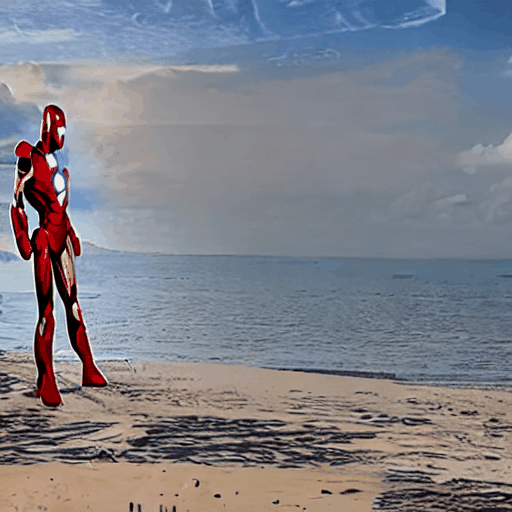

In [ ]:
# @title Play the Video output with caption
# GAI-11b [Team18-63] Display Video & Caption
import os
from IPython.display import Image, display, Markdown

# From GAI-26
search_directory = OUTPUT_DIR

def display_gif_with_caption(gif_path, caption):
    html_code = f'''
    <div style="text-align: left;">
        <p style="font-weight: bold; margin: 10px 0; padding-left:70px">{caption}</p>
        <br>
    </div>
    '''
    display(HTML(html_code))

# Search for GIF files in the directory and its subdirectories
for root, dirs, files in os.walk(search_directory):
    for file in files:
        if file.lower().endswith('.gif') and not file.lower().startswith('sample'):
            # Construct the full path to the GIF file
            gif_path = os.path.join(root, file)
            # Extract the file name from the path and remove the file extension
            gif_caption = os.path.splitext(file)[0]
            # Display the GIF
            display(Image(filename=gif_path, width=300))
            # Display the Caption
            display_gif_with_caption(gif_path, gif_caption)


### Step 7: Get FID Value

In [ ]:
#@title Select folder containing the Gifs

import ipywidgets as widgets
from ipywidgets import Layout, Box, Dropdown, Label
import os

gif_folder_path = os.path.join(os.getcwd(),'/content/FollowYourPose/Inference')

#get all videos into a list

files = [i for i in os.listdir(gif_folder_path) if os.path.isdir(os.path.join(gif_folder_path, i))]
files.append("")
#Layout
form_item_layout = Layout(
    display='flex',
    flex_flow='row',
    justify_content='space-between',
)

#dropdown initialization with filenames
gif_dropdown_input = 'Dropdown_input'
gif_dropdown = widgets.Dropdown(description='▶️:',options=(files), layout=Layout(width='50%'))
# Handling of dropdown if no videos in selected folder
gif_dropdown.disabled = len(files) == 0
gif_dropdown.options = [f'No GIFs available in charades folder'] if len(files) == 0 else files

def dropdown_handler(change):
    global gif_dropdown_input
    global gif_full_path
    print('\r','Chosen Folder: ' + str(change.new),end='')
    gif_dropdown_input = change.new
    gif_full_path = os.path.join(gif_folder_path, gif_dropdown.value)
    folder_full_path = gif_full_path
gif_dropdown.observe(dropdown_handler, names='value')

#form items -- label and dropdown
form_items = [
    Box([Label(value='Choose a sample gif folder from the Inference folder'),
         gif_dropdown], layout=form_item_layout)]

form = Box(form_items, layout=Layout(
    display='flex',
    flex_flow='column',
    border='solid 1px',
    align_items='stretch',
    width='50%',
    padding = '1%'
))

#display the elements
display(form)


Box(children=(Box(children=(Label(value='Choose a sample gif folder from the Inference folder'), Dropdown(desc…

 Chosen Folder: sample-1000-33-2023-11-18 14:05:51.618198

In [ ]:
import os
import imageio
import cv2
#@title Extarct frames from Gif
# Path to the folder containing GIFs


# Create a folder to store the extracted frames (you can change this path)
output_folder_1 = 'extracted_frames'
os.makedirs(output_folder_1, exist_ok=True)
# Desired size for the resized images
target_size = (299, 299)
# Loop through all files in the GIFs folder
for gif_path_extract in os.listdir(gif_full_path):
    # Check if the file is a GIF
    if gif_path_extract.lower().endswith('.gif'):
        # Full path to the GIF file
        gif_path_extract = os.path.join(gif_full_path, gif_path_extract)

        # Read the GIF file
        gif_reader = imageio.get_reader(gif_path_extract)

        # Create a subfolder for each GIF
        gif_output_folder = os.path.join(output_folder_1, gif_path_extract[:-4])
        os.makedirs(gif_output_folder, exist_ok=True)

        # Loop through the frames and save each one as an image
        for i, frame in enumerate(gif_reader):
          resized_frame = cv2.resize(frame, target_size)
          # Save the frame as a PNG image
          imageio.imsave(os.path.join(gif_output_folder, f'frame_{i:04d}.png'), resized_frame)

        print(f'Extracted {len(gif_reader)} frames from {gif_path_extract} to {gif_output_folder}')



Extracted 8 frames from /content/FollowYourPose/Inference/sample-1000-33-2023-11-18 14:05:51.618198/Iron man on the beach.gif to /content/FollowYourPose/Inference/sample-1000-33-2023-11-18 14:05:51.618198/Iron man on the beach


In [ ]:
import cv2
import os
#@title Extarct frames from Selected Video

# Directory where you want to save the frames
output_folder_1 = 'video_frames'

video_path_frames = os.path.join(gif_full_path, output_folder_1)
os.makedirs(video_path_frames, exist_ok=True)

# Open the video file
cap = cv2.VideoCapture(original_path)

# Read and save each frame as an image
frame_count = 0
target_size = (299, 299)
while True:
    ret, frame = cap.read()

    if not ret:
        break  # End of video


    # Resize the frame to the target size
    resized_frame = cv2.resize(frame, target_size)

    # Save the resized frame as an image (you can choose a different image format)
    frame_filename = os.path.join(video_path_frames, f'frame_{frame_count:04d}.jpg')
    cv2.imwrite(frame_filename, resized_frame)

    frame_count += 1

# Release the video capture object
cap.release()

print(f"Extracted {frame_count} frames to {output_folder_1}")


Extracted 522 frames to video_frames


In [ ]:
!pip install pytorch-fid

Calculating FID for Iron man on the beach
FID Score: 394.4913330992069


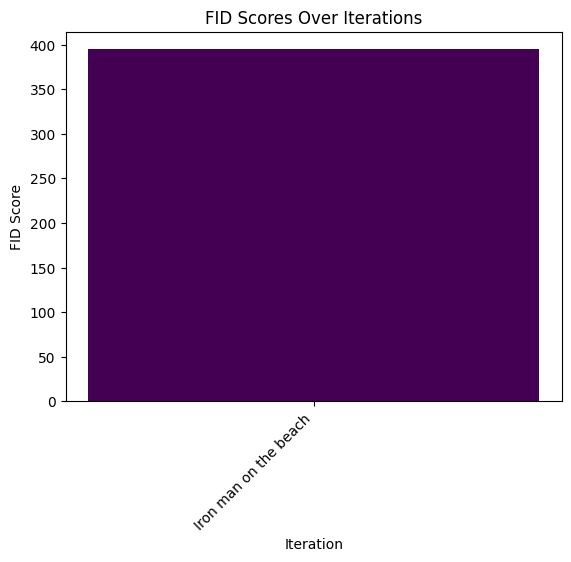

In [ ]:
import os
import subprocess
import matplotlib.pyplot as plt
from collections import Counter

#@title Calculate FID between the reference dataset and GIF frames
# Get a list of all items in the directory
all_items = os.listdir(gif_full_path)

# Filter out directories you want to exclude
excluded_directories = ['.ipynb_checkpoints', 'video_frames']
subdirectories = [item for item in all_items if os.path.isdir(os.path.join(gif_full_path, item)) and item not in excluded_directories]

fid_scores = []  # Initialize a list to store FID scores

for subdirectory in subdirectories:
    print("Calculating FID for", subdirectory)
    gif_frames = os.path.join(gif_full_path, subdirectory)

    # Run the FID calculation command and capture the output
    command = f"python -m pytorch_fid '{video_path_frames}' '{gif_frames}'"
    output = subprocess.check_output(command, shell=True, text=True)

    # Find the line containing the FID score
    fid_line = [line for line in output.split('\n') if 'FID:' in line]

    # Extract the FID score from the line and append to the list
    if fid_line:
        fid_score_str = fid_line[0].split('FID:')[1].strip()
        fid_score = float(fid_score_str)
        fid_scores.append(fid_score)
        print("FID Score:", fid_score)
    else:
        print("FID Score not found in the output.")

# Same name of subdirectories to set color and label
subdir_counts = Counter(subdirectories)
colors = plt.cm.viridis(range(len(subdir_counts)))
bar_labels = {}

for subdirectory, count in subdir_counts.items():
    if count > 1:
        base_color = colors[subdirectories.index(subdirectory)]
        for i in range(1, count + 1):
            bar_labels[subdirectory + f'#{i}'] = base_color
    else:
        bar_labels[subdirectory] = colors[subdirectories.index(subdirectory)]

# Plot the bar graph after all iterations
plt.bar(range(len(fid_scores)), fid_scores, color=[bar_labels[subdir] for subdir in subdirectories])
plt.xlabel('Iteration')
plt.ylabel('FID Score')
plt.title('FID Scores Over Iterations')
plt.xticks(range(len(fid_scores)), [subdir for subdir in subdirectories], rotation=45, ha='right')
plt.show()


In [ ]:
# @title Running MMPose on GIF to generate superimpose skeleton on resultant GIF
# [TEAM18-75] GAI-39

import os
import subprocess
from IPython.display import clear_output
import shutil

# Define the directory containing the GIFs or videos
search_directory = OUTPUT_DIR  # Update this with the path to your directory

# Define the output directory for the superimposed videos
vis_out_dir = "/content/FollowYourPose/mmpose/skeleton_output/Superimposed/"

shutil.rmtree(vis_out_dir)

# Make sure the output directory exists
os.makedirs(vis_out_dir, exist_ok=True)

# Initialize Video Index
video_index = 0

# Loop through all files in the directory
for root, dirs, files in os.walk(search_directory):
    for file in files:
        if file.lower().endswith(('.gif')) and not file.lower().startswith('sample'):
            # Construct the full path to the input video file
            input_path = os.path.join(root, file)
            video_filename = os.path.splitext(os.path.basename(input_path))[0]

            # Construct the output video path
            output_video_path = f"/content/FollowYourPose/Inference/convertmp4/{video_filename}_{video_index}.mp4"
            os.makedirs(os.path.dirname(output_video_path), exist_ok=True)  # Ensure the parent directory exists

            # Run FFmpeg to convert the input video (if it's a GIF) and save it to the output directory
            if file.lower().endswith('.gif'):
                cmd = ["ffmpeg", "-i", input_path, output_video_path]
                subprocess.run(cmd)
                print(f"GIF converted to mp4 and saved at: {output_video_path}")
            else:
                output_video_path = input_path  # Use the original video file

            %cd /content/FollowYourPose/mmpose/demo

            # Run Inference for Skeleton Superimposed format
            !python inferencer_demo.py \
                "{output_video_path}" \
                --pose2d human --vis-out-dir "{vis_out_dir}" --thickness 4

            output_file = os.path.join(vis_out_dir, f"{video_filename}_{video_index}.mp4")
            video_index = video_index + 1

            if os.path.exists(output_file):
                clear_output(wait=True)
                print(f"Result Video with SuperImposed skeleton from mmpose has been saved to Path.")
            else:
                print(f"\nError: Result video '{output_file}' does not exist.")


Result video with SuperImposed skeleton from mmpose has been saved to Path: /content/FollowYourPose/mmpose/skeleton_output/Superimposed/.


In [ ]:
# @title Display Superimposed Skeleton on Resultant Video
# TEAM18-75 GAI-39

import os
import subprocess
from IPython.display import Image, display, HTML
import shutil


# Define the input directory with MP4 files
input_directory = '/content/FollowYourPose/mmpose/skeleton_output/Superimposed'
# Define the output directory for GIF files
output_directory = '/content/FollowYourPose/mmpose/skeleton_output/Superimposed_GIF'

shutil.rmtree(output_directory)

# Create the output directory if it doesn't exist
os.makedirs(output_directory, exist_ok=True)

def convert_mp4_to_gif(input_mp4, output_gif):
    cmd = ["ffmpeg", "-i", input_mp4, output_gif]
    subprocess.run(cmd)

def display_gif_with_caption(caption):
    html_code = f'''
    <div style="text-align: left;">
        <p style="font-weight: bold; margin: 10px 0; padding-left:70px">{caption}</p>
        <br>
    </div>
    '''
    display(HTML(html_code))

# Search for MP4 files in the input directory and convert them to GIF
for root, dirs, files in os.walk(input_directory):
    for file in files:
        if file.lower().endswith('.mp4') and not file.lower().startswith('sample'):
            mp4_path = os.path.join(root, file)
            gif_filename = os.path.splitext(file)[0] + '.gif'
            gif_path = os.path.join(output_directory, gif_filename)

            # Convert MP4 to GIF
            convert_mp4_to_gif(mp4_path, gif_path)

            #Display The Gif
            display(Image(filename=gif_path, width=300))

            # Display the caption
            gif_caption = os.path.splitext(file)[0]
            display_gif_with_caption(gif_caption)


# Training
The training section allows users to create a new model. This includes:
- Creating the required caption CSV file for training
- Creating a folder to store the new model
- Creating a new config file for the new model
- Running the training on the model

It also allows users to choose a dataset subfolder from the `data` folder to be used for the training, and to cycle through the videos in that subfolder to do the training step on multiple videos for that model.

In [ ]:
%cd /content/FollowYourPose/
!python3.8 -m pip install -r requirements.txt
!pip install MoviePy

/content/FollowYourPose
  Using cached transformers-4.26.1-py3-none-any.whl (6.3 MB)
  Using cached triton-1.1.1-cp38-cp38-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (18.2 MB)
  Attempting uninstall: transformers
    Found existing installation: transformers 4.26.0
    Uninstalling transformers-4.26.0:
      Successfully uninstalled transformers-4.26.0
  Attempting uninstall: triton
    Found existing installation: triton 2.1.0
    Uninstalling triton-2.1.0:
      Successfully uninstalled triton-2.1.0


##Save model name as an output folder
ipywidgets is used to display the UI elements for the dropdown. A directory with the specified model name would be created under /content/FollowYourPose/model, where the config YAML files for different videos would be saved.

In [ ]:
#[GAI - 14 , TEAM 18 - 27]
#[GAI - 19 , TEAM 18 - 32]
# @title Save model name as an output folder
import os
import ipywidgets as widgets

# Create directories if they don't exist
os.makedirs("/content/FollowYourPose/model", exist_ok=True)

# Define the save folder
save_folder = "/content/FollowYourPose/model"

# Create a text widget for entering the model name
model_name_widget = widgets.Text(description='Model Name:', placeholder='Enter model name...')
display(model_name_widget)  # Display the widget to the user

# Function to handle the model name submission
def save_model(sender):
    model_name = model_name_widget.value  # Get the entered model name

    # Ensure the file name has a ".txt" extension
    if not model_name.endswith(".txt"):
        model_name += ".txt"

    # Check if the model name is already in use
    if os.path.exists(os.path.join(save_folder, model_name)):
        print(f"The model name '{model_name}' is already in use. Please enter a unique name.")
    else:
        # Specify the file content you want to save
        file_content = "This is the content of the file."

        # Create the full path to the file in the selected folder
        file_path = os.path.join(save_folder, model_name)

        try:
            with open(file_path, "w") as file:
                file.write(file_content)
            print(f"File '{model_name}' has been saved in '{save_folder}'.")
        except Exception as e:
            print(f"An error occurred: {e}")

# Add an event handler for the button click
save_button = widgets.Button(description="Save Model")
save_button.on_click(save_model)
display(save_button)


Text(value='', description='Model Name:', placeholder='Enter model name...')

Button(description='Save Model', style=ButtonStyle())

File 'test.txt' has been saved in '/content/FollowYourPose/model'.


## Creating a config file for pretrained model
- Creates a timestamped config file under models folder, obtained by copying pose_train.yaml and then changing the relevant fields
- Trimming to 8 seconds for the video selected in the earlier dropdown
- Finetuning process for the video selected



In [ ]:
#@title Creating CSV file for training purposes
import csv

# Sample data
data = [
    {"part_id": "charades", "clip_id": "0CFQV.mp4", "caption": "A person walking to their wardrobe and opening it and then looks into the mirror."},
    {"part_id": "charades", "clip_id": "0CX32.mp4", "caption": "A person runs into the living room, carrying a towel and a broom. The person walks over to the window and opens it."},
    {"part_id": "charades", "clip_id":"0DJ6R.mp4" , "caption": "A person opens a desk drawer and takes something out. The person goes to leave, but pauses in the doorway."},
    {"part_id": "charades", "clip_id": "0GH5O.mp4", "caption": "A person grabs a towel as they are leaving the house, and walk through the doorway smiling."},
    {"part_id": "charades", "clip_id": "0IFCL.mp4", "caption": "A person closes the door and starts tidying the shelf.  Then they start leaving."},
    {"part_id": "charades", "clip_id": "0JXN3.mp4", "caption": "A person is tidying their living room when they begin to sneeze. Their friend brings this person medicine from the shelf."},
    {"part_id": "charades", "clip_id": "0M6IY.mp4", "caption": "Person sweeps the floor with a broom.   Person the puts the broom away. Person takes a nap on the sofa and awakens after hearing a noise.  Person answers the phone."},
    {"part_id": "charades", "clip_id": "0M9ZO.mp4", "caption": "Person takes off shoes and starts making a sandwich in the kitchen.  Person begins smiling after finishing sandwich, and then starts tidying up the counter."},
    {"part_id": "charades", "clip_id": "0NN7I.mp4", "caption": "Person is throwing a towel towards a pillow and putting a book away."},
    {"part_id": "charades", "clip_id": "0NVG2.mp4", "caption": "A person sits on the bed and takes their shoes off. The person then begins to eat and drink the food that is on the side table."},
    {"part_id": "sims4action", "clip_id": "Co_S1K1_fC6.avi", "caption": "A person is preparing ingredients in a bowl and mixing it. Then, the person begins to cook over the stove."},
    {"part_id": "sims4action", "clip_id": "Co_S3K1_fC5.avi", "caption": "A person is pouring food into the pan. The person begins to fry the food and flips it, but it falls on the floor. The person picks it up and puts it back into the pan. Person cooks a second time but the food catches on fire. Person tries to extinguish the fire by hitting the pan with the spatula."},

]

# Define the CSV file name
folder_path = "/content/FollowYourPose/data/"

csv_file = "caption_rm2048_train.csv"
# Create the full file path by joining the path and the file name
csv_file_path = folder_path + csv_file


# Write the data to the CSV file
with open(csv_file_path, mode="w", newline="") as file:
    fieldnames = ["part_id", "clip_id", "caption"]
    writer = csv.DictWriter(file, fieldnames=fieldnames)

    # Write the header
    writer.writeheader()

    # Write the data rows
    for row in data:
        writer.writerow(row)

print(f"CSV file '{csv_file}' has been created.{csv_file_path}")


CSV file 'caption_rm2048_train.csv' has been created./content/FollowYourPose/data/caption_rm2048_train.csv


###Copying pose_train.yaml and inputting video_path

By making a copy of pose_train.yaml obtained from FollowYourPose/configs, we ensure that the YAML file for the new model has the correct structure. The more notable changes are `video_path` under `train_data`, `skeleton_path` and `output_dir`, where the output of the trained model is saved and includes the sample gifs generated.

In [ ]:
#@title Copying pose_train.yaml and inputting video_path
import yaml
from datetime import datetime

if resized_video_full_path == "":
  resized_video_full_path = os.path.join(video_path, video_dropdown.value.split(".")[0] + "_resized.mp4")
elif resized_video_full_path == "":
  resized_video_full_path = os.path.join(video_path, folder_dropdown.value, video_dropdown.value.split(".")[0] + "_resized.mp4")


with open('/content/FollowYourPose/configs/pose_train.yaml', 'r') as file:
  new_config_file = yaml.safe_load(file)

localcurrentdateandtime = datetime.now()
replaced = str(localcurrentdateandtime).replace(" ", "-")

#making directory for hdvila
#os.makedirs("/content/FollowYourPose/data/charades/part_1/", exist_ok=True)

#reducing video to 8 seconds
#copying the 8 second video into part_1/video_clips/video.mp4

from moviepy.video.io.ffmpeg_tools import ffmpeg_extract_subclip
ffmpeg_extract_subclip(resized_video_full_path, 0, 8, targetname=f"{folder_full_path}/8_sec_{video_dropdown.value.split('.')[0]}_resized.mp4")

#changing video path to the one in video_dropdown
new_config_file["train_data"]["video_path"] = f"{folder_full_path}/8_sec_{video_dropdown.value.split('.')[0]}_resized.mp4"
new_config_file["validation_data"]["video_length"] = 8
new_config_file["max_train_steps"] = 50
new_config_file["checkpointing_steps"] = 25
new_config_file["validation_steps"] = 50
new_config_file["train_data"]["n_sample_frames"] = 8
new_config_file["gradient_checkpointing"] = True
new_config_file["validation_data"]["prompts"] = ["A Iron man on the beach"]
new_config_file["output_dir"] = f"output/{model_name_widget.value}/{video_dropdown.value}-{replaced}"
if skeleton_path == "":
  new_config_file["skeleton_path"] = "./pose_example/vis_ikun_pose2.mov"
  skeleton_path = "./pose_example/vis_ikun_pose2.mov"
else:
  new_config_file["skeleton_path"] = skeleton_path


new_config_filepath = f'/content/FollowYourPose/model/{model_name_widget.value}_{video_dropdown.value.split(".")[0]}_{replaced}.yaml'

with open(new_config_filepath, 'w') as file:
    yaml.dump(new_config_file, file, sort_keys=False)

print(open(new_config_filepath).read())

Moviepy - Running:
>>> "+ " ".join(cmd)
Moviepy - Command successful
pretrained_model_path: ./checkpoints/stable-diffusion-v1-4
output_dir: output/test/0CFQV.mp4-2023-11-18-14:17:09.375047
train_data:
  video_path: /content/FollowYourPose/data/charades/8_sec_0CFQV_resized.mp4
  prompt: None
  n_sample_frames: 8
  width: 512
  height: 512
  sample_start_idx: 0
  sample_frame_rate: 4
  dataset_set: train
validation_data:
  prompts:
  - A Iron man on the beach
  video_length: 8
  width: 512
  height: 512
  num_inference_steps: 50
  guidance_scale: 12.5
  use_inv_latent: false
  num_inv_steps: 50
  dataset_set: val
learning_rate: 3e-5
train_batch_size: 1
max_train_steps: 50
checkpointing_steps: 25
validation_steps: 50
trainable_modules:
- attn1.to_q
- attn2.to_q
- attn_temp
- conv_temporal
skeleton_path: /content/FollowYourPose/mmpose/skeleton_output/Visualization/0CFQV_resized.mp4
seed: 33
mixed_precision: 'no'
use_8bit_adam: false
gradient_checkpointing: true
enable_xformers_memory_effic

In [ ]:
#@title Training process from the yaml file created above
#remember to change the checkpoint_steps to 500?
#pose_train.yaml must change the video_length to 8 and change the skeleton_path
#copy paste the new HDvila file to the one here and do so for the rest of the txt file in the github as well
#create ur own csv file. Msg priya if u want the csv file(if lazy)
#data/charades/part_1/video_1.mp4 (create this path so the csv will work)
#!accelerate launch train_followyourpose.py --config=CONFIG_NAME

%cd /content/FollowYourPose


# !accelerate launch train_followyourpose.py --config="configs/pose_train.yaml"
import os
import yaml
import ipywidgets as widgets
import subprocess
from IPython.display import Javascript, HTML, display, clear_output

import torch
torch.backends.cuda.split_kernel_apply_limit = 128

command = f"accelerate launch train_followyourpose.py --config={new_config_filepath} --skeleton_path={skeleton_path}"
process = subprocess.Popen(command, shell=True, stdout=subprocess.PIPE, stderr=subprocess.STDOUT, universal_newlines=True)
base_path = os.path.join(os.getcwd(), '/content/FollowYourPose/')
#config_path = command.split('--config=')[1].split()[0]
config_path = command.split('--config=')[1].split(" --skeleton_path")[0]

# Function to load prompts from selected YAML file
def count_prompts_from_file():
    with open(os.path.join(base_path, config_path)) as f:
        config = yaml.safe_load(f)
        prompts = config['validation_data']['prompts']
    return len(prompts)

# Get the number of prompts from the YAML file
num_prompts = count_prompts_from_file()
num_max_total_progress = ((num_prompts + 1)*100) + 50

# Progress bars
total_progress_widget = widgets.IntProgress(min=0, max=num_max_total_progress, description='Total Progress:', style={'description_width': 'initial'})
general_progress_widget = widgets.IntProgress(min=0, max=100, description='Initialization:', style={'description_width': 'initial'})
individual_prompt_widgets = []  # List to store individual prompt progress bars

# Create individual progress bars for each prompt
for i in range(num_prompts):
    prompt_progress_widget = widgets.IntProgress(min=0, max=100, description=f'Prompt {i + 1}\'s progress:', style={'description_width': 'initial'})
    individual_prompt_widgets.append(prompt_progress_widget)

# Display the progress bars
display(total_progress_widget)
display(general_progress_widget)
for widget in individual_prompt_widgets:
    display(widget)


# DEBUGGING THINGS MAYBE
output_widget = widgets.Output(layout={'border': '1px solid black', 'max_height': '200px', 'overflow_y': 'auto'})
display(output_widget)  # Display the output widget


individual_progress_sum = 0
def update_total_progress():
    individual_progress_sum = sum(widget.value for widget in individual_prompt_widgets)
    num_total_progress = general_progress_widget.value + individual_progress_sum
    total_progress_widget.value = num_total_progress

global prompt_index, finish_line_counter
prompt_index = -2
finish_line_counter = 0
def update_progress(output):
    parts = output.strip().split() # Split each line by space into parts

    if len(parts) >= 3:
        global finish_line_counter
        if "subprocess.CalledProcessError" in output:
            total_progress_widget.value = num_max_total_progress
            total_progress_widget.bar_style = 'danger'

        # Initialization progress
        if parts[1].find('%') != -1:
            percentage = int(parts[1][:parts[1].find('%')])  # Extract the percentage, removing the '%' sign
            general_progress_widget.value = percentage
            update_total_progress()

            if general_progress_widget.value == 100:
                general_progress_widget.bar_style = 'success'

        # Individual prompt progress
        elif parts[0].find('%') != -1:
            global prompt_index
            if int(parts[0][:parts[0].find('%')]) == 0:
                prompt_index += 1
            prompt_percentage = int(parts[0][:parts[0].find('%')])
            individual_prompt_widgets[prompt_index].value = prompt_percentage
            update_total_progress()

            if individual_prompt_widgets[prompt_index].value == 100:
                individual_prompt_widgets[prompt_index].bar_style = 'success'

        elif parts[0] == 'Configuration':
            total_progress_widget.value += 10
            finish_line_counter += 1

    # Finishing messages
    if finish_line_counter == 4:
        total_progress_widget.value = num_max_total_progress
        total_progress_widget.bar_style = 'success'

    # DEBUGGING THINGS
    with output_widget:
        # clear_output(wait=True) # if using this, remove the max-height from output widget
        print(output, end="")  # print output as it is

# Process output logss
for line in iter(process.stdout.readline, ''):
    update_progress(line)

# Wait for the process to complete
process.communicate()

/content/FollowYourPose


IntProgress(value=0, description='Total Progress:', max=250, style=ProgressStyle(description_width='initial'))

IntProgress(value=0, description='Initialization:', style=ProgressStyle(description_width='initial'))

IntProgress(value=0, description="Prompt 1's progress:", style=ProgressStyle(description_width='initial'))

Output(layout=Layout(border='1px solid black', max_height='200px', overflow_y='auto'))

('', None)

## Choosing dataset subfolder
- Allows users to choose a specific dataset subfolder, and train models based on the dataset.
- Cycles through each of the videos in the dataset folder when doing the training

In [ ]:
# @title Choose a dataset subfolder from the data folder to use for the training
# Get the list of folders in the data directory
video_path = os.path.join(os.getcwd(), '/content/FollowYourPose/data')
folders_in_path = [folder for folder in os.listdir(video_path) if os.path.isdir(os.path.join(video_path, folder))]


# Initialize dropdowns for choosing folder
folder_dropdown_dataset = widgets.Dropdown(options=folders_in_path, description='📂:', layout=Layout(width='50%'))



#Layout
form_item_layout = Layout(
    display='flex',
    flex_flow='row',
    justify_content='space-between',
)



def folder_dropdown_dataset_handler(change):
    global selected_folder
    selected_folder = change.new

folder_dropdown_dataset.observe(folder_dropdown_dataset_handler, names='value')


# Form items - folder dropdown and video dropdown
form_items = [
    Box([Label(value='Choose a folder from the data directory'), folder_dropdown_dataset], layout=form_item_layout),

]

form = Box(form_items, layout=Layout(
    display='flex',
    flex_flow='column',
    border='solid 1px',
    align_items='stretch',
    width='50%',
    padding = '1%'
))

#display the elements
display(form)

def choosenfolder_dropdown_handler(change):
    global chosen_folder_dropdown_input
    chosen_folder_dropdown_input = change.new





Box(children=(Box(children=(Label(value='Choose a folder from the data directory'), Dropdown(description='📂:',…

In [ ]:
#@title Get path of the video folder
full_path = os.path.join(video_path,folder_dropdown_dataset.value)
print(full_path)

/content/FollowYourPose/data/charades


### Cycling through each video in the folder to do the Training step on multiple videos consecutively

* The videos are taken from the full_file path
* It goes through a for loop and get the output of each input
* the output is later saved in the output file with unique file names

In [ ]:
#@title Function to creat yaml file for video in folder
import yaml
from datetime import datetime
from moviepy.video.io.ffmpeg_tools import ffmpeg_extract_subclip

def create_yaml_train(video_name,skeleton_path):
  clip_full_path = os.path.join(full_path, video_name)


  with open('/content/FollowYourPose/configs/pose_train.yaml', 'r') as file:
    new_config_file = yaml.safe_load(file)

  localcurrentdateandtime = datetime.now()
  replaced = str(localcurrentdateandtime).replace(" ", "-")

  #reducing video to 8 seconds
  #copying the 8 second video into part_1/video_clips/video.mp4
  ffmpeg_extract_subclip(clip_full_path, 0, 8, targetname=f"{full_path}/8_sec_{video_name.split('.')[0]}_resized.mp4")

  #changing video path to the one in video_dropdown
  new_config_file["train_data"]["video_path"] = f"{full_path}/8_sec_{video_name.split('.')[0]}_resized.mp4"
  new_config_file["validation_data"]["video_length"] = 8
  new_config_file["max_train_steps"] = 50
  new_config_file["checkpointing_steps"] = 25
  new_config_file["validation_steps"] = 50
  new_config_file["train_data"]["n_sample_frames"] = 8
  new_config_file["gradient_checkpointing"] = True
  new_config_file["validation_data"]["prompts"] = ["A Iron man on the beach"]
  new_config_file["output_dir"] = f"output/{model_name_widget.value}/{video_name}-{replaced}"
  if skeleton_path == "":
    new_config_file["skeleton_path"] = "./pose_example/vis_ikun_pose2.mov"
    skeleton_path = "./pose_example/vis_ikun_pose2.mov"
  else:
    new_config_file["skeleton_path"] = skeleton_path


  new_config_filepath = f'/content/FollowYourPose/model/{model_name_widget.value}_{video_name.split(".")[0]}_{replaced}.yaml'
  print(new_config_filepath)

  with open(new_config_filepath, 'w') as file:
      yaml.dump(new_config_file, file, sort_keys=False)

  print(open(new_config_filepath).read())
  return new_config_filepath



In [ ]:
  # !accelerate launch train_followyourpose.py --config="configs/pose_train.yaml"
  #@title Training fucntion for video in the folder
  import os
  import yaml
  import ipywidgets as widgets
  import subprocess
  from IPython.display import Javascript, HTML, display, clear_output

  import torch
%cd /content/FollowYourPose

def training(new_config_filepath, skeleton_path):
    torch.backends.cuda.split_kernel_apply_limit = 128

    command = f"accelerate launch train_followyourpose.py --config={new_config_filepath} --skeleton_path={skeleton_path}"
    process = subprocess.Popen(command, shell=True, stdout=subprocess.PIPE, stderr=subprocess.STDOUT, universal_newlines=True)
    base_path = os.path.join(os.getcwd(), '/content/FollowYourPose/')
    #config_path = command.split('--config=')[1].split()[0]
    config_path = command.split('--config=')[1].split(" --skeleton_path")[0]

    # Function to load prompts from selected YAML file
    def count_prompts_from_file():
        with open(os.path.join(base_path, config_path)) as f:
            config = yaml.safe_load(f)
            prompts = config['validation_data']['prompts']
        return len(prompts)

    # Get the number of prompts from the YAML file
    num_prompts = count_prompts_from_file()
    num_max_total_progress = ((num_prompts + 1)*100) + 50

    # Progress bars
    total_progress_widget = widgets.IntProgress(min=0, max=num_max_total_progress, description='Total Progress:', style={'description_width': 'initial'})
    general_progress_widget = widgets.IntProgress(min=0, max=100, description='Initialization:', style={'description_width': 'initial'})
    individual_prompt_widgets = []  # List to store individual prompt progress bars

    # Create individual progress bars for each prompt
    for i in range(num_prompts):
        prompt_progress_widget = widgets.IntProgress(min=0, max=100, description=f'Prompt {i + 1}\'s progress:', style={'description_width': 'initial'})
        individual_prompt_widgets.append(prompt_progress_widget)

    # Display the progress bars
    display(total_progress_widget)
    display(general_progress_widget)
    for widget in individual_prompt_widgets:
        display(widget)


    # DEBUGGING THINGS MAYBE
    output_widget = widgets.Output(layout={'border': '1px solid black', 'max_height': '200px', 'overflow_y': 'auto'})
    display(output_widget)  # Display the output widget


    individual_progress_sum = 0
    def update_total_progress():
        individual_progress_sum = sum(widget.value for widget in individual_prompt_widgets)
        num_total_progress = general_progress_widget.value + individual_progress_sum
        total_progress_widget.value = num_total_progress

    global prompt_index, finish_line_counter
    prompt_index = -2
    finish_line_counter = 0
    def update_progress(output):
        parts = output.strip().split() # Split each line by space into parts

        if len(parts) >= 3:
            global finish_line_counter
            if "subprocess.CalledProcessError" in output:
                total_progress_widget.value = num_max_total_progress
                total_progress_widget.bar_style = 'danger'

            # Initialization progress
            if parts[1].find('%') != -1:
                percentage = int(parts[1][:parts[1].find('%')])  # Extract the percentage, removing the '%' sign
                general_progress_widget.value = percentage
                update_total_progress()

                if general_progress_widget.value == 100:
                    general_progress_widget.bar_style = 'success'

            # Individual prompt progress
            elif parts[0].find('%') != -1:
                global prompt_index
                if int(parts[0][:parts[0].find('%')]) == 0:
                    prompt_index += 1
                prompt_percentage = int(parts[0][:parts[0].find('%')])
                individual_prompt_widgets[prompt_index].value = prompt_percentage
                update_total_progress()

                if individual_prompt_widgets[prompt_index].value == 100:
                    individual_prompt_widgets[prompt_index].bar_style = 'success'

            elif parts[0] == 'Configuration':
                total_progress_widget.value += 10
                finish_line_counter += 1

        # Finishing messages
        if finish_line_counter == 4:
            total_progress_widget.value = num_max_total_progress
            total_progress_widget.bar_style = 'success'

        # DEBUGGING THINGS
        with output_widget:
            # clear_output(wait=True) # if using this, remove the max-height from output widget
            print(output, end="")  # print output as it is

    # Process output logss
    for line in iter(process.stdout.readline, ''):
        update_progress(line)

    # Wait for the process to complete
    process.communicate()




/content/FollowYourPose


In [ ]:
#@title Looping through videos in selected folder

#new_path = os.path.join(full_path,"video_clips")
#removed the video_clips as i found it better, to change the file type change the hdvila file, which can be found in github
from datetime import datetime

videos = [i for i in os.listdir(full_path) if os.path.isfile(os.path.join(full_path, i))]
print(videos)

for clips in videos:
  if "_resized.mp4" in clips and "8_sec" not in clips:
    print(clips)
    test = create_yaml_train(clips,skeleton_path)
    print(test)
    training(test, skeleton_path)




['0CFQV.mp4', '8_sec_0CFQV_resized.mp4', '0GH5O.mp4', '0NN7I.mp4', '0CFQV_resized.mp4', '0IFCL.mp4', '0GH5O_resized.mp4', '0CX32.mp4', '0NVG2.mp4', '0M9ZO.mp4', '0JXN3.mp4', '0DJ6R.mp4', '0M6IY.mp4']
0CFQV_resized.mp4
Moviepy - Running:
>>> "+ " ".join(cmd)
Moviepy - Command successful
/content/FollowYourPose/model/test_0CFQV_resized_2023-11-18-14:44:02.906121.yaml
pretrained_model_path: ./checkpoints/stable-diffusion-v1-4
output_dir: output/test/0CFQV_resized.mp4-2023-11-18-14:44:02.906121
train_data:
  video_path: /content/FollowYourPose/data/charades/8_sec_0GH5O_resized.mp4
  prompt: None
  n_sample_frames: 8
  width: 512
  height: 512
  sample_start_idx: 0
  sample_frame_rate: 4
  dataset_set: train
validation_data:
  prompts:
  - A Iron man on the beach
  video_length: 8
  width: 512
  height: 512
  num_inference_steps: 50
  guidance_scale: 12.5
  use_inv_latent: false
  num_inv_steps: 50
  dataset_set: val
learning_rate: 3e-5
train_batch_size: 1
max_train_steps: 50
checkpointing_

IntProgress(value=0, description='Total Progress:', max=250, style=ProgressStyle(description_width='initial'))

IntProgress(value=0, description='Initialization:', style=ProgressStyle(description_width='initial'))

IntProgress(value=0, description="Prompt 1's progress:", style=ProgressStyle(description_width='initial'))

Output(layout=Layout(border='1px solid black', max_height='200px', overflow_y='auto'))

0GH5O_resized.mp4
Moviepy - Running:
>>> "+ " ".join(cmd)
Moviepy - Command successful
/content/FollowYourPose/model/test_0GH5O_resized_2023-11-18-14:59:32.388562.yaml
pretrained_model_path: ./checkpoints/stable-diffusion-v1-4
output_dir: output/test/0GH5O_resized.mp4-2023-11-18-14:59:32.388562
train_data:
  video_path: /content/FollowYourPose/data/charades/8_sec_0GH5O_resized.mp4
  prompt: None
  n_sample_frames: 8
  width: 512
  height: 512
  sample_start_idx: 0
  sample_frame_rate: 4
  dataset_set: train
validation_data:
  prompts:
  - A Iron man on the beach
  video_length: 8
  width: 512
  height: 512
  num_inference_steps: 50
  guidance_scale: 12.5
  use_inv_latent: false
  num_inv_steps: 50
  dataset_set: val
learning_rate: 3e-5
train_batch_size: 1
max_train_steps: 50
checkpointing_steps: 25
validation_steps: 50
trainable_modules:
- attn1.to_q
- attn2.to_q
- attn_temp
- conv_temporal
skeleton_path: /content/FollowYourPose/mmpose/skeleton_output/Visualization/0CFQV_resized.mp4
se

IntProgress(value=0, description='Total Progress:', max=250, style=ProgressStyle(description_width='initial'))

IntProgress(value=0, description='Initialization:', style=ProgressStyle(description_width='initial'))

IntProgress(value=0, description="Prompt 1's progress:", style=ProgressStyle(description_width='initial'))

Output(layout=Layout(border='1px solid black', max_height='200px', overflow_y='auto'))

##Moving the newest output for the model into /content/FollowYourPose/checkpoints folder
The timestamps of the models outputs are compared, and the latest timestamp is taken. `shutil` is used to move the files.

In [ ]:
# @title Moving latest output for the model into /content/FollowYourPose/checkpoints folder
import os
import shutil

output_file = "/content/FollowYourPose/output/" + model_name_widget.value
checkpoint_path = "/content/FollowYourPose/checkpoints"
new_checkpoint_folder = ""
# Find all the subdirectories in the source directory
model_files = [d for d in os.listdir(output_file) if os.path.isdir(os.path.join(output_file, d))]

# Filter the subdirectories for those containing "Video" in their names
video_directories = [d for d in model_files if ".mp4" in d]

if video_directories:
    # Sort the "Video" directories by modification time to get the latest one
    latest_video_dir = max(video_directories, key=lambda d: os.path.getmtime(os.path.join(output_file, d)))

    # Check if the new folder was created after the "Video" folder in the checkpoint path
    latest_video_creation_time = os.path.getctime(os.path.join(output_file, latest_video_dir))
    existing_video_in_checkpoint_path = None

    for folder in os.listdir(checkpoint_path):
        if model_name_widget.value in folder and latest_video_dir.split("-")[0] in folder:
            existing_video_in_checkpoint_path = os.path.join(checkpoint_path, folder)
            break

    if existing_video_in_checkpoint_path:
        existing_video_creation_time = os.path.getctime(existing_video_in_checkpoint_path)
        if latest_video_creation_time > existing_video_creation_time:

            shutil.move(os.path.join(output_file, latest_video_dir), os.path.join(checkpoint_path, model_name_widget.value + "-" + latest_video_dir))
            new_checkpoint_folder =  os.path.join(checkpoint_path, model_name_widget.value + "-" + latest_video_dir)
            print("The current 'Video' folder was created before the current version, and it has been updated in the checkpoint path.")
        else:
            print("The 'Video' folder in the checkpoint path was created after the current version.")
    else:
        # Copy the new "Video" folder to the checkpoint path
        shutil.move(os.path.join(output_file, latest_video_dir), os.path.join(checkpoint_path, model_name_widget.value + "-" + latest_video_dir))
        new_checkpoint_folder =  os.path.join(checkpoint_path, model_name_widget.value + "-" + latest_video_dir)
        print("The 'Video' folder has been copied to the checkpoint path.")












The 'Video' folder has been copied to the checkpoint path.


In [ ]:
# @title Removing older checkpoint folder from the latest output model
import os
import shutil


if new_checkpoint_folder =="":
  print("There are no new checkpoint folders added")
else:
  # List all directories in the specified path
  all_folders = os.listdir(new_checkpoint_folder)

  # Filter folders that start with "checkpoint-"
  checkpoint_folders = [folder for folder in all_folders if folder.startswith("checkpoint-")]

  # Sort the checkpoint folders by their numerical value
  sorted_folders = sorted(checkpoint_folders, key=lambda x: int(x.split('-')[1]))

  if sorted_folders:
      # Get the highest numbered checkpoint folder
      highest_checkpoint_folder = sorted_folders[-1]

      # Delete the other checkpoint folders
      for folder in checkpoint_folders:
          if folder != highest_checkpoint_folder:
              folder_path = os.path.join(new_checkpoint_folder, folder)
              shutil.rmtree(folder_path)
      print("Deleted checkpoint folders except the highest numbered one:", highest_checkpoint_folder)
  else:
      print("No checkpoint folders found.")


Deleted checkpoint folders except the highest numbered one: checkpoint-50


Due to memory of GPU, we recommend set video_length=8 in ./config/pose_sample.yaml for running successfully.

Meanwhile, we should keep the skeleton frame length(./followyourpose/pipelines/pipeline_followyourpose.py:422 ) equal with video_length

#Testing

In [17]:
# GAI-21
# @title Step 1: Choose a dataset subfolder from the data folder to use for testing
# Get the list of folders in the data directory

import ipywidgets as widgets
from ipywidgets import Layout, Box, Dropdown, Label
import os

# Get the list of folders in the data directory
video_path = os.path.join(os.getcwd(), '/content/FollowYourPose/data')
folders_in_path = [folder for folder in os.listdir(video_path) if os.path.isdir(os.path.join(video_path, folder))]

# Initialize dropdowns for choosing folder
folder_dropdown = widgets.Dropdown(options=folders_in_path, description='📂:', layout=Layout(width='50%'))
video_dropdown = widgets.Dropdown(description='▶️:', layout=Layout(width='50%')) # initially empty

#Layout
form_item_layout = Layout(
    display='flex',
    flex_flow='row',
    justify_content='space-between',
)

def update_video_dropdown(selected_folder):
    # Get the list of files in the selected folder
    files = [i for i in os.listdir(os.path.join(video_path, selected_folder)) if i.endswith('.mp4') and os.path.isfile(os.path.join(video_path, selected_folder, i))]
    video_dropdown.options = files
    # Handling of dropdown if no videos in selected folder
    video_dropdown.disabled = len(files) == 0
    video_dropdown.options = [f'No videos available in {selected_folder} folder'] if len(files) == 0 else files

def folder_dropdown_handler(change):
    selected_folder = change.new
    update_video_dropdown(selected_folder)
folder_dropdown.observe(folder_dropdown_handler, names='value')


initial_selected_folder = folder_dropdown.value
update_video_dropdown(initial_selected_folder)

# Form items - folder dropdown and video dropdown
form_items = [
    Box([Label(value='Choose a folder from the data directory'), folder_dropdown], layout=form_item_layout),
    Box([Label(value='Choose a video from the selected folder'), video_dropdown], layout=form_item_layout)
]

form = Box(form_items, layout=Layout(
    display='flex',
    flex_flow='column',
    border='solid 1px',
    align_items='stretch',
    width='50%',
    padding = '1%'
))

#display the elements
display(form)


def video_dropdown_handler(change):
    global chosen_video_dropdown_input
    global video_full_path
    chosen_video_dropdown_input = change.new
    print('\r', 'Chosen video:', chosen_video_dropdown_input, end='')
    video_full_path = os.path.join(video_path, folder_dropdown.value, video_dropdown.value)
video_dropdown.observe(video_dropdown_handler, names='value')

Box(children=(Box(children=(Label(value='Choose a folder from the data directory'), Dropdown(description='📂:',…

 Chosen video: Co_S1K1_fC6_resized.mp4

In [18]:
# GAI-23 [Team18-15] Run Testing Sequence Based on Models selected
# @title Step 2: Choose up to 5 model(s) for testing


import glob

path = os.path.join(os.getcwd(), '/content/FollowYourPose/checkpoints/')

existing_yaml_files = glob.glob("/content/FollowYourPose/configs/pose_test_*.yaml")

existing_model_names = [os.path.basename(file).replace("pose_", "").replace(".yaml", "") for file in existing_yaml_files]

folder_names = [name for name in os.listdir(path) if os.path.isdir(os.path.join(path, name)) and name != "followyourpose_checkpoint-1000" and name != ".ipynb_checkpoints"]

form_item_layout = Layout(
    display='flex',
    flex_flow='row',
    justify_content='space-between',
)

folder_names.insert(0, "")

video_length_widget = widgets.IntText(
    value=0,
    layout=Layout(width='50%')
)

selected_models = []

for model in folder_names[1:]:
    if model not in existing_model_names:
        checkbox = widgets.Checkbox(value=False, description=model, indent=False, layout=Layout(width='50%'))
        selected_models.append(checkbox)

def inttext_handler(change):
    global video_length
    print('\r', 'Chosen video length: ' + str(change.new), end='')
    video_length = change.new

video_length_widget.observe(inttext_handler, names='value')

button = widgets.Button(description="Generate")

import os

def on_button_click(b):
    video_length = video_length_widget.value
    selected_model_names = [model.description for model in selected_models if model.value]
    if len(selected_model_names) > 5:
        print("\n Please choose up to 5 models at most.")
    elif not selected_model_names:
        print("\n Please choose at least one model")
    else:
        for model_name in selected_model_names:
            file_path = open("/content/FollowYourPose/configs/pose_sample.yaml", "r")
            with open("/content/FollowYourPose/configs/pose_sample.yaml", "r") as file:
                lines = file.readlines()
            if lines:
                new_first_line = 'pretrained_model_path: "./checkpoints/' + model_name + '"\n'
                lines[0] = new_first_line
                yaml_file_path = f"/content/FollowYourPose/configs/pose_test_{model_name}.yaml"
                with open(yaml_file_path, "w") as file:
                    file.writelines(lines)
                print(f"\nLine has been changed for {model_name}, YAML file created: {yaml_file_path}")

                # Implement the logic for pose_sample.csv
                new_config_file = {
                    "pretrained_model_path": f'./checkpoints/{model_name}',
                    "output_dir": "output",
                    "validation_data": {
                        "prompts": [
                            "Iron man on the beach",
                            "Stormtrooper on the sea",
                            "Astronaut on the beach"
                        ],
                        "video_length": str(video_length),
                        "width": 512,
                        "height": 512,
                        "num_inference_steps": 50,
                        "guidance_scale": 12.5,
                        "use_inv_latent": False,
                        "num_inv_steps": 50,
                        "dataset_set": "val"
                    },
                    "train_batch_size": 1,
                    "validation_steps": 100,
                    "resume_from_checkpoint": "./checkpoints/followyourpose_checkpoint-1000",
                    "seed": 33,
                    "mixed_precision": 'no',
                    "gradient_checkpointing": False,
                    "enable_xformers_memory_efficient_attention": True
                }

                with open("pose_sample.yaml", "w") as file_yaml:
                    for key, value in new_config_file.items():
                        if isinstance(value, dict):
                            file_yaml.write(f"{key}:\n")
                            for sub_key, sub_value in value.items():
                                if isinstance(sub_value, list):
                                    file_yaml.write(f"  {sub_key}:\n")
                                    for item in sub_value:
                                        file_yaml.write(f"    - \"{item}\"\n")
                                else:
                                    file_yaml.write(f"  {sub_key}: {sub_value}\n")
                        else:
                            file_yaml.write(f"{key}: {value}\n")


button.on_click(on_button_click)

checkbox_layout = Box(selected_models, layout=Layout(display='flex', justify_content='flex-start'))

form_items = [
    Box([Label(value='Choose Pre-trained Models'), checkbox_layout], layout=form_item_layout),
]

form = Box(form_items, layout=Layout(
    display='flex',
    flex_flow='column',
    border='solid 1px',
    align_items='stretch',
    width='100%',
    padding='1%'
))

display(form)
display(button)


Box(children=(Box(children=(Label(value='Choose Pre-trained Models'), Box(children=(Checkbox(value=False, desc…

Button(description='Generate', style=ButtonStyle())

In [19]:
# @title Step 3: Edit Text Prompts for all selected model's config
import os
import ipywidgets as widgets
from IPython.display import clear_output
import yaml

# To fix the yaml saving indents improperly
class IndentDumper(yaml.Dumper):
    def increase_indent(self, flow=False, indentless=False):
        return super(IndentDumper, self).increase_indent(flow, False)

# Assigning prompts from yaml
config_path = "/content/FollowYourPose/configs"  # Update with your path

# Function to load prompts from selected YAML file
def load_prompts_from_file(file_name):
    with open(os.path.join(config_path, file_name)) as f:
        config = yaml.safe_load(f)
    return config['validation_data']['prompts']

# Get a list of YAML files that start with "pose_test"
yaml_files = [file for file in os.listdir(config_path) if file.endswith('.yaml') and file.startswith('pose_test')]

# Initialize widgets
tags_container = widgets.VBox()
# yaml_dropdown = widgets.Dropdown(options=yaml_files, description='Select YAML File📮', style={'description_width': 'initial'})
text_widgets = []
delete_buttons = []

# Function to initialize widgets for each prompt
def initialize_widgets(prompts):
    global text_widgets, delete_buttons
    text_widgets = [widgets.Text(value=prompt, description='Prompt {}'.format(i + 1)) for i, prompt in enumerate(prompts)]
    delete_buttons = [widgets.Button(description='Delete', layout=widgets.Layout(width='70px')) for _ in text_widgets]
    for i, delete_button in enumerate(delete_buttons):
        delete_button.on_click(lambda event, index=i: handle_delete(event, index))
    for index, text_widget in enumerate(text_widgets):
        text_widget.observe(lambda change, index=index: handle_text_change(change, index), names='value')

new_prompt_widget = widgets.Text(description='New Prompt:', placeholder='Enter a new prompt...')
add_prompt_button = widgets.Button(description='Add Prompt')  # Add prompt btn

# Function to add a new prompt
def add_prompt(sender):
    new_prompt = new_prompt_widget.value.strip()
    if new_prompt:
        new_text_widget = widgets.Text(value=new_prompt, description='Prompt {}'.format(len(text_widgets) + 1))
        text_widgets.append(new_text_widget)
        delete_button = widgets.Button(description='Delete', layout=widgets.Layout(width='70px'))
        delete_buttons.append(delete_button)
        new_text_widget.observe(lambda change, index=len(text_widgets) - 1: handle_text_change(change, index),
                                names='value')
        delete_button.on_click(lambda event, index=len(text_widgets) - 1: handle_delete(event, index))

        # Add the new prompt to all "pose_test" yaml files
        for yaml_file in yaml_files:
            with open(os.path.join(config_path, yaml_file)) as f:
                config = yaml.safe_load(f)
            config['validation_data']['prompts'].append(new_prompt)
            with open(os.path.join(config_path, yaml_file), 'w') as f:
                yaml.dump(config, f, sort_keys=False, Dumper=IndentDumper)

    new_prompt_widget.value = ''
    update_tags_container()

add_prompt_button.on_click(add_prompt)  # onClick event

# Function to update display of prompts
def update_tags_container():
    print("Editing prompts for: " , yaml_files )
    tags_container.children = [
        widgets.HBox([text_widget, delete_button]) for text_widget, delete_button in
        zip(text_widgets, delete_buttons)] + [new_prompt_widget, add_prompt_button]

# Function to handle text changes
def handle_text_change(change, index):
    # If textfield change, write to all yaml files
    if change['type'] == 'change':
        for yaml_file in yaml_files:
            with open(os.path.join(config_path, yaml_file)) as f:
                config = yaml.safe_load(f)
            config['validation_data']['prompts'][index] = change['new'].strip()
            with open(os.path.join(config_path, yaml_file), 'w') as f:
                yaml.dump(config, f, sort_keys=False, Dumper=IndentDumper)

    # If textfield empty, delete
    if not change['new'].strip():
        handle_delete(None, index)

# Function to handle prompt deletion
def handle_delete(event, index):
    for yaml_file in yaml_files:
        with open(os.path.join(config_path, yaml_file)) as f:
            config = yaml.safe_load(f)
        del config['validation_data']['prompts'][index]
        with open(os.path.join(config_path, yaml_file), 'w') as f:
            yaml.dump(config, f, sort_keys=False, Dumper=IndentDumper)
    reset_cell_display()  # Refresh cell display

# Function to reset cell display
def reset_cell_display():
    prompts = load_prompts_from_file(yaml_files[0]) if yaml_files else []
    clear_output()  # Clear cell display
    initialize_widgets(prompts)  # Re-initialize widgets
    update_tags_container()  # Update tags container
    display(tags_container)  # Display the tags container

reset_cell_display()  # Refresh cell display


Editing prompts for:  ['pose_test_stable-diffusion-v1-4.yaml', 'pose_test_model-test-1_Co_S1K1_fC6_resized.yaml']


**Installing Necessary Libraries for MMPose**

For Step 4: Skeleton Using mmpose for selected model(s), we will need to reinstall certain libraries that we have done in Inference section Step 1.1,Step 1.2, Step1.3 and Step 1.4. Do install the needed libraries before proceeding to Step 4.


In [24]:
# GAI-23 [Team18-15] Run Testing Sequence
# @title Step 4: Skeleton Using mmpose for selected model(s)
from IPython.display import HTML, display, Video, clear_output
from moviepy.editor import VideoFileClip
from ipywidgets import widgets, Output, interactive
import ipywidgets as widgets
from ipywidgets import HBox
import os
import time
import subprocess
import yaml

# Assigning prompts from yaml
config_path = "/content/FollowYourPose/configs"  # Update with your path

# Get a list of YAML files that start with "pose_test"
yaml_files = [file for file in os.listdir(config_path) if file.endswith('.yaml') and file.startswith('pose_test')]
print("Models to train" , yaml_files)

# Dropdown to select video format
video_format = widgets.Dropdown(
    options=["Black Background", "Skeleton Superimposed"],
    description="Select format:"
)

def trim_video(input_path, output_path, duration_seconds):
    clip = VideoFileClip(input_path)
    trimmed_clip = clip.subclip(0, duration_seconds)
    trimmed_clip.write_videofile(output_path, codec="libx264", audio_codec="aac")
    clip.reader.close()

def change_frame_rate(input_video_path, new_fps=155):
    # Load the video clip
    clip = VideoFileClip(input_video_path)

    # Change the frame rate
    clip = clip.set_fps(new_fps)

    # Write the modified video to a new file (overwriting the input file)
    clip.write_videofile(input_video_path, codec="libx264", audio_codec="aac")

    # Close the original video clip
    clip.close()

# Loop through each YAML file
for yaml_file in yaml_files:
    file_path = '/content/FollowYourPose/configs/' + yaml_file
    print(file_path)
    with open(file_path, 'r') as file:
        config = yaml.safe_load(file)
    current_pretrained_model_path = config.get('pretrained_model_path', '')


    # Choose Video
    clip_path = os.path.join(f'/content/FollowYourPose/data/sims4action', video_dropdown.value)
    yaml_filename = os.path.splitext(yaml_file)[0]
    video_filename = os.path.splitext(os.path.basename(clip_path))[0]
    filepath_name = os.path.splitext(os.path.basename(current_pretrained_model_path))[0]  # Remove ".mp4" extension

    print('Current pretrained_model path:', filepath_name)
    print('Current video:', video_filename)
    print("This will take about 1-5mins...")
    print("\n")

    # Inference function
    vis_out_dir = "skeleton_output/Visualization"  # Visualization output directory
    os.makedirs(vis_out_dir, exist_ok=True)
    try:
        !python demo/inferencer_demo.py \
        "{clip_path}" \
        --pose2d human --vis-out-dir "{vis_out_dir}"  --black-background
    except Exception as e:
        print(f"An error occurred: {e}. Try re-installing needed libraries again (Inference: Step 1.1)")


    current_file_name = f'/content/FollowYourPose/mmpose/skeleton_output/Visualization/{video_filename}.mp4'
    if os.path.exists(current_file_name):
    # Specify the current file name and the desired new name
      expected_output_video_path = f'/content/FollowYourPose/mmpose/skeleton_output/Visualization/{yaml_filename}_{video_filename}.mp4'

      # Rename the MP4 name
      os.rename(current_file_name, expected_output_video_path)
      print(f"File renamed from {current_file_name} to {expected_output_video_path}")

      # Run the ffmpeg command to change the frame rate
      command = f"ffmpeg -i {expected_output_video_path} -r 155 {expected_output_video_path}"
      subprocess.run(command, shell=True)

    if os.path.exists(expected_output_video_path):
        clear_output(wait=True)
        print(f"Video saved to Path: {vis_out_dir}.")
    else:
        print("\nError, try re-installing needed libraries again (Inference: Step 1.2 & Step 1.3)")




Video saved to Path: skeleton_output/Visualization.


In [ ]:
# @title Step 5: Install Upgrades needed to run FollowYourPose
!pip install --upgrade accelerate
!pip install --upgrade xformers

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 261.4/261.4 kB 4.1 MB/s eta 0:00:00
  Attempting uninstall: accelerate
    Found existing installation: accelerate 0.16.0
    Uninstalling accelerate-0.16.0:
      Successfully uninstalled accelerate-0.16.0
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.8/211.8 MB 2.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 670.2/670.2 MB 104.5 MB/s eta 0:00:01

In [25]:

# @title Step 6: Choose Location where videos are outputted to


#@markdown Please provide the name of the directory where the video should be saved.
OUTPUT_DIR = "/content/FollowYourPose/Inference/Testing" #@param {type:"string" }

# Changing save_path in txt2video.py
path = os.path.join(os.getcwd(), '/content/FollowYourPose/txt2video.py')

a_file = open(path, "r")
list_of_lines = a_file.readlines()
start_index_171 = list_of_lines[171 -1].find('"') + 1
end_index_171 = list_of_lines[171 -1].rfind('"')

start_index_174 = list_of_lines[174 -1].find('"') + 1
end_index_174 = list_of_lines[174 -1].rfind('"')

# Line 171 OG: 6tabs save_videos_grid(sample, f"{output_dir}/inference/sample-{global_step}-{str(seed)}-{now}/{prompt}.gif")
list_of_lines[171 - 1] = list_of_lines[171 - 1][:start_index_171] + f"{OUTPUT_DIR}/{{global_step}}-{{str(seed)}}-{{now}}/{{prompt}}.gif" + list_of_lines[171 - 1][end_index_171:]

# Line 174 OG: 4tabs save_path = f"{output_dir}/inference/sample-{global_step}-{str(seed)}-{now}.gif"
list_of_lines[174 - 1] = list_of_lines[174 - 1][:start_index_174] + f"{OUTPUT_DIR}/{{global_step}}-{{str(seed)}}-{{now}}.gif" + list_of_lines[174 - 1][end_index_174:]

a_file = open("/content/FollowYourPose/txt2video.py", "w")
a_file.writelines(list_of_lines)
a_file.close()

print(f"[*] Videos will be saved at {OUTPUT_DIR}/...")
!mkdir -p $OUTPUT_DIR


[*] Videos will be saved at /content/FollowYourPose/Inference/Testing/...


In [26]:
# GAI-38 [Team18-74] View response time
# @title Step 7: Run FollowYourPose

%cd /content/FollowYourPose/
import ipywidgets as widgets
import subprocess
import time
import threading

import os
import yaml
from IPython.display import Javascript, HTML, display, clear_output

import torch
torch.backends.cuda.split_kernel_apply_limit = 128


def change_save_path(file_path, line_number, output_dir, model_name):
    # Read the content of the file
    with open(file_path, "r") as file:
        list_of_lines = file.readlines()

    # Find start and end indices for quotes in the specified line
    start_index = list_of_lines[line_number - 1].find('"') + 1
    end_index = list_of_lines[line_number - 1].rfind('"')

    # Modify the line with the new save path
    list_of_lines[line_number - 1] = list_of_lines[line_number - 1][:start_index] + f"{output_dir}/{model_name}/{{prompt}}.gif" + list_of_lines[line_number - 1][end_index:]

    # Write the modified content back to the file
    with open(file_path, "w") as file:
        file.writelines(list_of_lines)


def print_output_with_response_time(command):
    # Customize and display the output widget and the response time widget.
    output_widget = widgets.Output(layout={'border': '1px solid black', 'max_height': '200px', 'overflow_y': 'auto'})
    response_time_widget = widgets.Text(description='Response time:', style={'description_width': 'initial'},
                                        layout={'width': '300px'}, disabled=False)


    # Create individual progress bars for each prompt
    for i in range(num_prompts):
        prompt_progress_widget = widgets.IntProgress(min=0, max=100, description=f'Prompt {i + 1}\'s progress:', style={'description_width': 'initial'})
        individual_prompt_widgets.append(prompt_progress_widget)


    # DISPLAY ALL
    display(response_time_widget)
    # PROGRESS BARS
    display(total_progress_widget)
    display(general_progress_widget)
    for widget in individual_prompt_widgets:
        display(widget)
    # OUTPUT WIDGET
    display(output_widget)

    with output_widget:
        display(HTML(f"<p style='color:yellow; font-weight:bold;'>Process starting...</p>"))

    start_time = time.time()
    process = subprocess.Popen(command, shell=True, stdout=subprocess.PIPE, stderr=subprocess.STDOUT,
                               universal_newlines=True)

    def update_response_time():
        while True:
            if process.poll() is not None:
                # The command has finished running.
                response_time = time.time() - start_time
                minutes, seconds = divmod(response_time, 60)
                if response_time < 60:
                    response_time_widget.value = f"{int(seconds)} seconds"
                else:
                    response_time_widget.value = f"{int(minutes)} min {int(seconds)} sec"
                response_time_widget.disabled = True  # Disable the text box to prevent further updates
                break
            else:
                response_time = time.time() - start_time
                minutes, seconds = divmod(response_time, 60)
                if response_time < 60:
                    response_time_widget.value = f"{int(seconds)} seconds"
                else:
                    response_time_widget.value = f"{int(minutes)} min {int(seconds)} sec"
                time.sleep(1)  # Update the response time every second.

    # Start another thread to update response time
    # daemon True ensures the thread will exit when prog exit, prevent mem leak
    threading.Thread(target=update_response_time, daemon=True).start()


    individual_progress_sum = 0
    def update_total_progress():
        individual_progress_sum = sum(widget.value for widget in individual_prompt_widgets)
        num_total_progress = general_progress_widget.value + individual_progress_sum
        total_progress_widget.value = num_total_progress

    global prompt_index_a, finish_line_counter_a
    prompt_index_a = -2
    finish_line_counter_a = 0
    def update_progress(output):
        parts = output.strip().split() # Split each line by space into parts

        if len(parts) >= 3:
            global finish_line_counter_a
            if "subprocess.CalledProcessError" in output:
                total_progress_widget.value = num_max_total_progress
                total_progress_widget.bar_style = 'danger'

            # Individual prompt progress
            elif parts[0].find('%') != -1:
                general_progress_widget.value = 100
                general_progress_widget.bar_style = 'success'


                global prompt_index_a
                if int(parts[0][:parts[0].find('%')]) == 0:
                    prompt_index_a += 1
                prompt_percentage = int(parts[0][:parts[0].find('%')])
                individual_prompt_widgets[prompt_index_a].value = prompt_percentage
                update_total_progress()

                if individual_prompt_widgets[prompt_index_a].value == 100:
                    individual_prompt_widgets[prompt_index_a].bar_style = 'success'

            elif len(parts) > 7 and 'Saved' in parts[7]:
                total_progress_widget.value += 19
                finish_line_counter_a += 1


            # Initiialization progress
            else:
              general_progress_widget.value += 3.5
              update_total_progress()
              if general_progress_widget.value == 100:
                  general_progress_widget.bar_style = 'success'

        # Finishing messages
        if finish_line_counter_a == 1:
            total_progress_widget.value = num_max_total_progress
            total_progress_widget.bar_style = 'success'



    while True:
        output = process.stdout.readline()
        if output:
            with output_widget:
                update_progress(output)
                print(output.strip())

        if process.poll() is not None:
            # The command has finished running.
            response_time = time.time() - start_time  # update last time
            with output_widget:
                display(HTML(f"Process completed in {response_time} seconds."))
            response_time_widget.disabled = True
            break


yaml_files = [file for file in os.listdir(config_path) if file.endswith('.yaml') and file.startswith('pose_test')]
clip_path = os.path.join('/content/FollowYourPose/data/charades', video_dropdown.value)
video_filename = os.path.splitext(os.path.basename(clip_path))[0]
yaml_filename = os.path.splitext(yaml_file)[0]
skeleton_path = f'/content/FollowYourPose/mmpose/skeleton_output/Visualization/{yaml_filename}_{video_filename}.mp4'
bases_path = os.path.join(os.getcwd(), '/content/FollowYourPose/configs/')

# Function to load prompts from selected YAML file
def count_prompts_from_file():
    with open(os.path.join(bases_path, f'{yaml_filename}.yaml')) as f:
        config = yaml.safe_load(f)
        prompts = config['validation_data']['prompts']
    return len(prompts)

# Get the number of prompts from the YAML file
num_prompts = count_prompts_from_file()
num_max_total_progress = ((num_prompts + 1)*100) + 20

# Progress bars
total_progress_widget = widgets.IntProgress(min=0, max=num_max_total_progress, description='Total Progress:', style={'description_width': 'initial'})
general_progress_widget = widgets.IntProgress(min=0, max=100, description='Initialization:', style={'description_width': 'initial'})
individual_prompt_widgets = []  # List to store individual prompt progress bars


for yaml_file in yaml_files:
    yaml_filename = os.path.splitext(yaml_file)[0]
    yaml_filename = yaml_filename.replace("pose_test_", "")
    print("Inferencing Model: ", yaml_filename)
    path = os.path.join(os.getcwd(), '/content/FollowYourPose/txt2video.py')
    change_save_path(path, 171, OUTPUT_DIR, yaml_filename)
    change_save_path(path, 174, OUTPUT_DIR, yaml_filename)
    !mkdir -p $OUTPUT_DIR

    print_output_with_response_time(
        command=f'TORCH_DISTRIBUTED_DEBUG=DETAIL accelerate launch txt2video.py --config=configs/{yaml_file} --skeleton_path={skeleton_path}')


/content/FollowYourPose
Inferencing Model:  stable-diffusion-v1-4


Text(value='', description='Response time:', layout=Layout(width='300px'), style=DescriptionStyle(description_…

IntProgress(value=0, description='Total Progress:', max=220, style=ProgressStyle(description_width='initial'))

IntProgress(value=0, description='Initialization:', style=ProgressStyle(description_width='initial'))

IntProgress(value=0, description="Prompt 1's progress:", style=ProgressStyle(description_width='initial'))

Output(layout=Layout(border='1px solid black', max_height='200px', overflow_y='auto'))

Inferencing Model:  model-test-1_Co_S1K1_fC6_resized


Text(value='', description='Response time:', layout=Layout(width='300px'), style=DescriptionStyle(description_…

IntProgress(value=100, bar_style='danger', description='Total Progress:', max=220, style=ProgressStyle(descrip…

IntProgress(value=100, bar_style='success', description='Initialization:', style=ProgressStyle(description_wid…

IntProgress(value=0, description="Prompt 1's progress:", style=ProgressStyle(description_width='initial'))

IntProgress(value=0, description="Prompt 1's progress:", style=ProgressStyle(description_width='initial'))

Output(layout=Layout(border='1px solid black', max_height='200px', overflow_y='auto'))

In [ ]:

import cv2
from skimage import metrics

def calculate_average_ssim(video1_path, video2_path):
    # Open the video files
    video1 = cv2.VideoCapture(video1_path)
    video2 = cv2.VideoCapture(video2_path)

    # Get the frame count (assumes both videos have the same number of frames)
    frame_count = int(video1.get(cv2.CAP_PROP_FRAME_COUNT))

    # Initialize a list to store SSIM values for each frame
    ssim_values = []

    for i in range(frame_count):
        # Read frames from the videos
        ret1, frame1 = video1.read()
        ret2, frame2 = video2.read()

        if not ret1 or not ret2:
            break

        # Convert frames to grayscale
        frame1_gray = cv2.cvtColor(frame1, cv2.COLOR_BGR2GRAY)
        frame2_gray = cv2.cvtColor(frame2, cv2.COLOR_BGR2GRAY)

        frame2_gray_resize = cv2.resize(frame2_gray, (299, 299))
        frame1_gray_resize = cv2.resize(frame1_gray, (299, 299))

        # Calculate SSIM for the current frame pair
        ssim = metrics.structural_similarity(frame1_gray_resize, frame2_gray_resize)

        ssim_values.append(ssim)

    # Calculate the average SSIM value
    average_ssim = sum(ssim_values) / len(ssim_values)

    # Release video capture objects
    video1.release()
    video2.release()

    return average_ssim

# GAI-24 [Team18-16] See Testing Sequence Result
# @title Step 8: Video Player for inference Original vs resultant gif comparison
from IPython import display
from IPython.display import HTML
from moviepy.editor import VideoFileClip, clips_array, TextClip

search_directory = OUTPUT_DIR
original_path = os.path.join(f'/content/FollowYourPose/data/charades/{video_dropdown.value}')
video_filename = os.path.splitext(os.path.basename(clip_path))[0]
i=1
original_path = video_path.split('/')[-1].split('.')[0]
#video_name = original_path.split('/')[-1].split('.')[0]
yaml_files = [file for file in os.listdir(config_path) if file.endswith('.yaml') and file.startswith('pose_test')]

# Search for GIF files in the directory and its subdirectories
for root, dirs, files in os.walk(search_directory):
    for file in files:
        if file.lower().endswith('.gif'):
            model_name = os.path.basename(root)
            # Construct the full path to the GIF file
            gif_path = os.path.join(root, file)
            gif_name = gif_path.split('/')[-1].split('.')[0]
            # Load the two video clips
            video1 = VideoFileClip(clip_path)
            video2 = VideoFileClip(gif_path)

            result = calculate_average_ssim(clip_path, gif_path)

            # Resize the video clips
            video1 = video1.resize(width=300)
            video2 = video2.resize(width=300)

            # Create an overlay by placing video2 on the right of video1
            final_video = clips_array([[video1, video2]])

            # Trim the final video to the first second
            final_video_trimmed = final_video.subclip(0, 1)

            # Loop the trimmed video
            final_video_loop = final_video_trimmed.loop(duration=10)  # Specify the total duration of the loop

            # Save the looped video to a file
            output_path = f"/content/FollowYourPose/Inference/Testing/looped_video_{i}.mp4"
            # Write the final video with captions to a file
            i+=1
            final_video_loop.write_videofile(output_path, codec='libx264', audio_codec='aac')


            markdown_text = f"# **Model_name: {model_name}**"
            display.display(display.Markdown(markdown_text))

            markdown_text = f"# Original Video: {video_filename} | Gif: {gif_name}"
            display.display(display.Markdown(markdown_text))


            display.display(display.Video(output_path, embed=True))
            print(f"Average SSIM between the two videos: {result}")

Moviepy - Building video /content/FollowYourPose/Inference/Testing/looped_video_1.mp4.
MoviePy - Writing audio in looped_video_1TEMP_MPY_wvf_snd.mp4


MoviePy - Done.
Moviepy - Writing video /content/FollowYourPose/Inference/Testing/looped_video_1.mp4



t:  57%|█████▋    | 172/300 [00:03<00:02, 44.12it/s, now=None]WARNING:py.warnings:/usr/local/lib/python3.10/dist-packages/moviepy/video/io/ffmpeg_reader.py:123: UserWarning: Warning: in file /content/FollowYourPose/Inference/Testing/stable-diffusion-v1-4/Iron man on the beach.gif, 786432 bytes wanted but 0 bytes read,at frame 20/22, at time 0.87/0.95 sec. Using the last valid frame instead.
  warnings.warn("Warning: in file %s, "%(self.filename)+

t:  59%|█████▉    | 178/300 [00:03<00:02, 46.21it/s, now=None]WARNING:py.warnings:/usr/local/lib/python3.10/dist-packages/moviepy/video/io/ffmpeg_reader.py:123: UserWarning: Warning: in file /content/FollowYourPose/Inference/Testing/stable-diffusion-v1-4/Iron man on the beach.gif, 786432 bytes wanted but 0 bytes read,at frame 21/22, at time 0.91/0.95 sec. Using the last valid frame instead.
  warnings.warn("Warning: in file %s, "%(self.filename)+



Moviepy - Done !
Moviepy - video ready /content/FollowYourPose/Inference/Testing/looped_video_1.mp4


# **Model_name: stable-diffusion-v1-4**

# Original Video: 0GH5O | Gif: Iron man on the beach

Average SSIM between the two videos: 0.2758937195279831
Moviepy - Building video /content/FollowYourPose/Inference/Testing/looped_video_2.mp4.
MoviePy - Writing audio in looped_video_2TEMP_MPY_wvf_snd.mp4


MoviePy - Done.
Moviepy - Writing video /content/FollowYourPose/Inference/Testing/looped_video_2.mp4



t:  59%|█████▊    | 176/300 [00:05<00:04, 27.96it/s, now=None]WARNING:py.warnings:/usr/local/lib/python3.10/dist-packages/moviepy/video/io/ffmpeg_reader.py:123: UserWarning: Warning: in file /content/FollowYourPose/Inference/Testing/test-0GH5O_resized.mp4-2023-11-18-14:59:32.388562/Iron man on the beach.gif, 786432 bytes wanted but 0 bytes read,at frame 20/22, at time 0.87/0.95 sec. Using the last valid frame instead.
  warnings.warn("Warning: in file %s, "%(self.filename)+

t:  60%|█████▉    | 179/300 [00:05<00:04, 28.13it/s, now=None]WARNING:py.warnings:/usr/local/lib/python3.10/dist-packages/moviepy/video/io/ffmpeg_reader.py:123: UserWarning: Warning: in file /content/FollowYourPose/Inference/Testing/test-0GH5O_resized.mp4-2023-11-18-14:59:32.388562/Iron man on the beach.gif, 786432 bytes wanted but 0 bytes read,at frame 21/22, at time 0.91/0.95 sec. Using the last valid frame instead.
  warnings.warn("Warning: in file %s, "%(self.filename)+



Moviepy - Done !
Moviepy - video ready /content/FollowYourPose/Inference/Testing/looped_video_2.mp4


# **Model_name: test-0GH5O_resized.mp4-2023-11-18-14:59:32.388562**

# Original Video: 0GH5O | Gif: Iron man on the beach

Average SSIM between the two videos: 0.2758937195279831


# References
**Followyourpose Framework**: https://github.com/mayuelala/FollowYourPose

> Used as the basis of this entire notebook

**MMpose**: https://github.com/open-mmlab/mim

> Used to create the skeleton video

**ipywidgets**: https://ipywidgets.readthedocs.io/en/7.x/examples/Widget%20List.html


> Used to display all the interactable elements in this notebook


